# Global plot style

In [2]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import pandas as pd
import os
import glob

# Set the color cycle to use colors from the 'magma' colormap
def set_cycle(num_colors = 10, start=0):
    colors = plt.cm.magma(np.linspace(0, 1, num_colors)[start:])
    mpl.rcParams['axes.prop_cycle'] = mpl.cycler(color=colors)
    return colors

plot_dpi = 600
plot_width = 12
plot_height_single = 3
plot_height_double = 6

set_cycle()

array([[1.46200e-03, 4.66000e-04, 1.38660e-02, 1.00000e+00],
       [9.29490e-02, 5.99040e-02, 2.39164e-01, 1.00000e+00],
       [2.65447e-01, 6.02370e-02, 4.61840e-01, 1.00000e+00],
       [4.45163e-01, 1.22724e-01, 5.06901e-01, 1.00000e+00],
       [6.20005e-01, 1.83840e-01, 4.97524e-01, 1.00000e+00],
       [8.04752e-01, 2.49911e-01, 4.42102e-01, 1.00000e+00],
       [9.44006e-01, 3.77643e-01, 3.65136e-01, 1.00000e+00],
       [9.92196e-01, 5.87502e-01, 4.06299e-01, 1.00000e+00],
       [9.96369e-01, 7.91167e-01, 5.53499e-01, 1.00000e+00],
       [9.87053e-01, 9.91438e-01, 7.49504e-01, 1.00000e+00]])

# The hybrid grid

yt : [WARNING  ] 2024-06-09 12:25:29,692 Cannot determine code units ==> Use units_override to specify the units
yt : [WARNING  ] 2024-06-09 12:25:29,697 Assuming   length unit = 1.000000 cm
yt : [WARNING  ] 2024-06-09 12:25:29,699 Assuming     time unit = 1.000000 s
yt : [WARNING  ] 2024-06-09 12:25:29,702 Assuming     mass unit = 1.000000 g
yt : [WARNING  ] 2024-06-09 12:25:29,705 Assuming magnetic unit = 3.544908 gauss
yt : [INFO     ] 2024-06-09 12:25:29,838 Parameters: current_time              = 0.008
yt : [INFO     ] 2024-06-09 12:25:29,840 Parameters: domain_dimensions         = [64 64 16]
yt : [INFO     ] 2024-06-09 12:25:29,841 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2024-06-09 12:25:29,845 Parameters: domain_right_edge         = [1.   1.   0.25]
yt : [INFO     ] 2024-06-09 12:25:29,846 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2024-06-09 12:25:31,080 xlim = 0.000000 1.000000
yt : [INFO     ] 2024-06-09 12:25:31,081 ylim = 0.000000

(800, 800, 4)


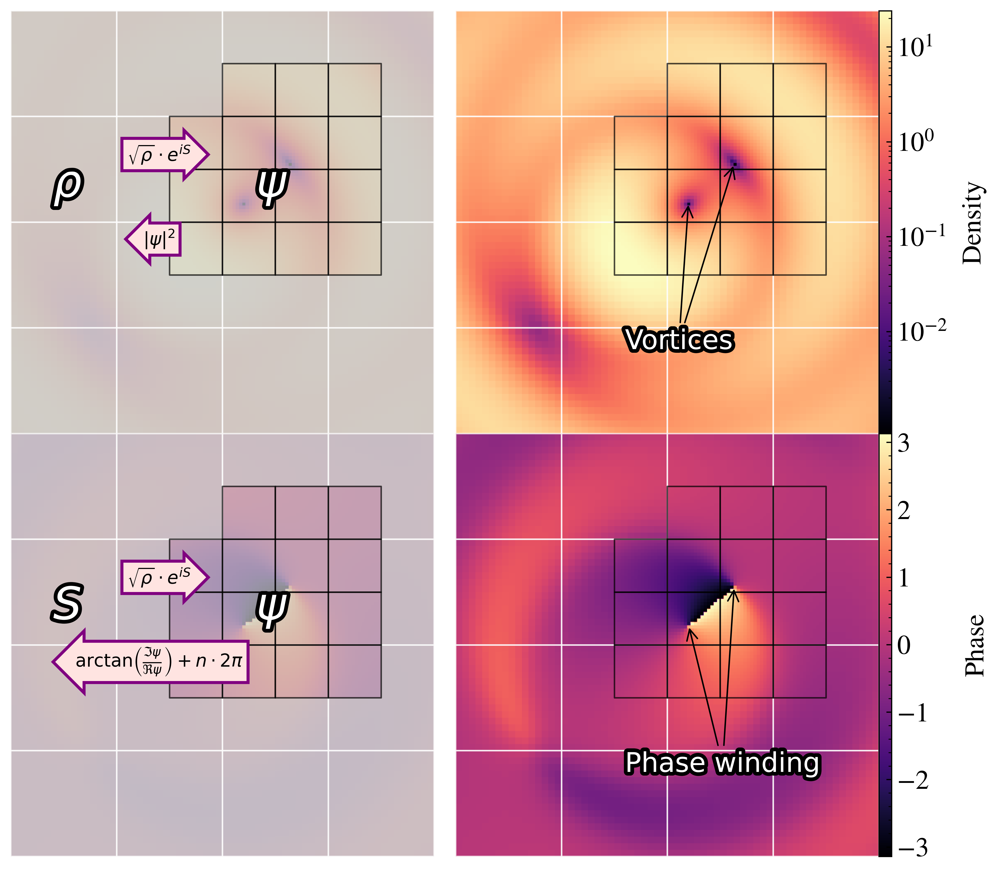

In [3]:
from __future__ import print_function, division, absolute_import

import argparse
import sys
import yt
import matplotlib
import matplotlib.pyplot as plt
import numpy as np

from mpl_toolkits.axes_grid1 import AxesGrid

import matplotlib.patheffects as PathEffects

colormap = 'magma'  # Define the colormap for the plots
# Create a series of datasets based on data files with indices in the specified range
dataset = yt.load("results/Data_000001")

current_axis = "z"

# Create a new figure for the current slice
fig = plt.figure(dpi=plot_dpi, figsize=(plot_width, plot_height_double))

# Create a grid of axes for multiple plots
grid = AxesGrid(
    fig,
    (0.075, 0.075, 0.85, 0.85),
    nrows_ncols=(2, 2),
    axes_pad=(0.2, 0.0),
    label_mode="L",
    share_all=True,
    cbar_location="right",
    cbar_mode="edge",
    direction="row",
    cbar_size="3%",
    cbar_pad="0%",
)

# Define the fields to plot
fields_to_plot = [
    ("gas", "density"),
    ("gamer", "Phase"),
]

# Create a slice plot for the current dataset and field
slice_plot = yt.SlicePlot(dataset, current_axis, fields_to_plot)
slice_plot.set_log(("gamer", "Phase"), False)

slice_plot.annotate_grids(periodic=False)

for field in fields_to_plot:
    slice_plot.set_cmap(field, colormap)

# For each plotted field, associate it with the corresponding AxesGrid axes
for i, field in enumerate(fields_to_plot):
    plot = slice_plot.plots[field]
    plot.figure = fig
    plot.axes = grid[2 * i].axes
    plot.cax = grid.cbar_axes[i]

# Create a second slice plot for comparison
slice_plot_2 = yt.SlicePlot(dataset, current_axis, fields_to_plot)
slice_plot_2.set_log(("gamer", "Phase"), False)
slice_plot_2.annotate_grids(periodic=False)

for field in fields_to_plot:
    slice_plot_2.set_cmap(field, colormap)

# Associate the second slice plot with the AxesGrid axes
for i, field in enumerate(fields_to_plot):
    plot = slice_plot_2.plots[field]
    plot.figure = fig
    plot.axes = grid[2 * i + 1].axes

# Redraw the plot on the AxesGrid axes
slice_plot._setup_plots()
slice_plot_2._setup_plots()

# Assuming 'z' axis slices, the size of the plot, and other parameters
axis = 'z'
width = 1#dataset.domain_width.min().value  # Adjust based on your dataset

# Create Fixed Resolution Buffers (FRBs) for density and AMR level visualization
res = [800, 800]  # Adjust resolution based on your needs

# Extracting AMR level data
# Note: Modify this part according to how you can get AMR level data from your dataset
amr_data = slice_plot.data_source.to_frb(width, res, height=width)

# Visualizing AMR levels
# Assume `amr_data["index", "grid_level"]` provides the AMR level data, you may need to adjust this
amr_levels = amr_data["index", "grid_level"]
level_0_mask = amr_levels == 0
level_1_mask = amr_levels == 1

# Initialize an RGBA image with full transparency (alpha = 0)
amr_image_rgba = np.zeros((res[0], res[1], 4), dtype=np.float32)  # Last dimension for RGBA

# Set colors with alpha for AMR levels
# Here, 0.5 is used as an example alpha value for both levels, adjust according to your preferences
light_grey_rgba = [0.8, 0.8, 0.8, 0.9]  # Light grey with alpha for level 0
dark_grey_rgba  = [0.8, 0.8, 0.8, 0.7]  # Dark grey with alpha for level 1

# Apply colors with alpha based on AMR level masks
amr_image_rgba[level_0_mask, :] = light_grey_rgba
amr_image_rgba[np.logical_not(level_0_mask), :] = dark_grey_rgba

print(amr_image_rgba.shape)

# Plotting the RGBA image with alpha
# Using the same extent as before to align with other plots
grid[0].imshow(amr_image_rgba, origin='lower', extent=[-0.5, 0.5, -0.5, 0.5])
grid[2].imshow(amr_image_rgba, origin='lower', extent=[-0.5, 0.5, -0.5, 0.5])

dy = 0.06

# Add annotations or other plot elements as needed
txt = grid[0].annotate(r"$\rho$", (-0.4, 0 + dy), fontsize=30, c="w")
txt.set_path_effects([PathEffects.withStroke(linewidth=5, foreground='k')])
#grid[0].annotate(r"$\rho$", (-0.4, 0), fontsize=28, c="white")
txt = grid[0].annotate(r"$\psi$", (0.08, 0 + dy), fontsize=30, c="w")
txt.set_path_effects([PathEffects.withStroke(linewidth=5, foreground='k')])

grid[0].text(-0.15, 0.1 + dy, r"$\sqrt{\rho} \cdot e^{iS}$",
            ha="center", va="center", rotation=0, size=12,
            bbox=dict(boxstyle="rarrow,pad=0.3",
                      fc="mistyrose", ec="purple", lw=2))
grid[0].text(-0.15, -0.1 + dy, r"$|\psi|^2$",
            ha="center", va="center", rotation=0, size=12,
            bbox=dict(boxstyle="larrow,pad=0.3",
                      fc="mistyrose", ec="purple", lw=2))

txt = grid[2].annotate(r"$S$", (-0.4, 0 + dy), fontsize=30, c="w")
txt.set_path_effects([PathEffects.withStroke(linewidth=5, foreground='k')])
txt = grid[2].annotate(r"$\psi$", (0.08, 0 + dy), fontsize=30, c="w")
txt.set_path_effects([PathEffects.withStroke(linewidth=5, foreground='k')])
grid[2].text(-0.15, 0.1 + dy, r"$\sqrt{\rho} \cdot e^{iS}$",
            ha="center", va="center", rotation=0, size=12,
            bbox=dict(boxstyle="rarrow,pad=0.3",
                      fc="mistyrose", ec="purple", lw=2))
grid[2].text(-0.15, -0.1 + dy, r"arctan$\left(\frac{\Im{\psi}}{\Re{\psi}}\right) + n \cdot 2 \pi$",
            ha="center", va="center", rotation=0, size=12,
            bbox=dict(boxstyle="larrow,pad=0.3",
                      fc="mistyrose", ec="purple", lw=2))


txt = grid[1].annotate("Vortices",
            xy=(0.158, 0.14), xycoords='data',
            xytext=(-0.1, -0.3), textcoords='data',
            arrowprops=dict(arrowstyle="->", connectionstyle="arc3"), c="w", fontsize=18)
txt.set_path_effects([PathEffects.withStroke(linewidth=5, foreground='k')])
grid[1].annotate("Vortices",
            xy=(0.05, 0.048), xycoords='data',
            xytext=(-0.1, -0.3), textcoords='data',
            arrowprops=dict(arrowstyle="->", connectionstyle="arc3"), c="w", fontsize=18, alpha=1)


txt = grid[3].annotate("Phase winding",
            xy=(0.158, 0.14), xycoords='data',
            xytext=(-0.1, -0.3), textcoords='data',
            arrowprops=dict(arrowstyle="->", connectionstyle="arc3"), c="w", fontsize=18)
txt.set_path_effects([PathEffects.withStroke(linewidth=5, foreground='k')])
grid[3].annotate("Phase winding",
            xy=(0.05, 0.048), xycoords='data',
            xytext=(-0.1, -0.3), textcoords='data',
            arrowprops=dict(arrowstyle="->", connectionstyle="arc3"), c="w", fontsize=18, alpha=1)

#grid[0].set_ylabel("$y$")
#grid[2].set_ylabel("$y$")
#grid[2].set_xlabel("$x$")
#grid[3].set_xlabel("$x$")
grid[0].axis("off")
grid[1].axis("off")
grid[2].axis("off")
grid[3].axis("off")
grid.cbar_axes[0].get_yaxis().labelpad = 10
grid.cbar_axes[0].get_yaxis().set_ticks([1e-2, 1e-1, 1, 1e1])
grid.cbar_axes[0].set_ylabel(r"Density", rotation=90)
grid.cbar_axes[1].get_yaxis().labelpad = 24
grid.cbar_axes[1].set_ylabel(r"Phase", rotation=90)
# Get the DumpID from dataset parameters and save the plot
dump_id = dataset.parameters["DumpID"]
plt.savefig("plots/boundary_matching.pdf", bbox_inches='tight')

# Close the current figure to release resources
plt.show()
plt.close()


# Gram-Fourier extension plot

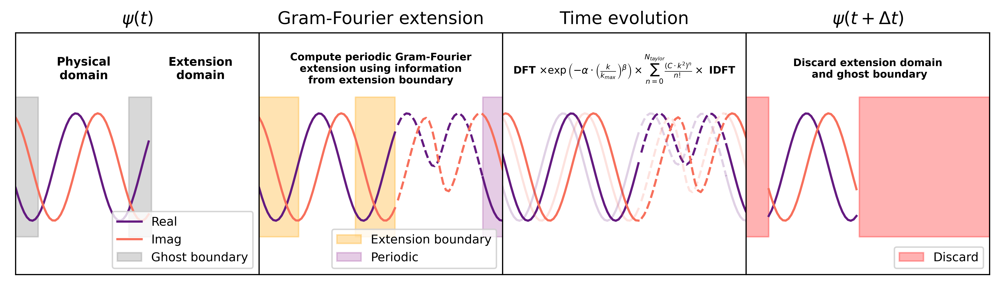

In [28]:
time_step =1

# Load wave functions for a specific timestep
original_psi = np.load(f"results/gram_fourier_extension/original_psi_{time_step}.npy")
fdp1 = np.load(f"results/gram_fourier_extension/fdp1_{time_step}.npy")
fdp2 = np.load(f"results/gram_fourier_extension/fdp2_{time_step}.npy")
psi = np.load(f"results/gram_fourier_extension/psi_{time_step}.npy")


ghostBoundarySize = 8
totalN = 32 + 2 * ghostBoundarySize
nDelta = 14

def plot_psi(ax, psi, title, highlight, initial, original=None):
    x = np.arange(len(psi))
    c1, c2 = plt.cm.magma(np.array([0.3, 0.7]))

    if highlight == "ghost":
        ax.plot(x, np.real(psi), c=c1, label='Real' if initial else None)
        ax.plot(x, np.imag(psi), c=c2, label='Imag' if initial else None)
    elif highlight == "boundary":
        y1     = np.real(psi)
        y2     = np.imag(psi)
        y1_len = len(y1)
        y2_len = len(y2)
        y1     = np.array([y1, y1]).flatten()
        y2     = np.array([y2, y2]).flatten()
        ax.plot(x[:totalN+1], y1[:totalN+1], c=c1, label='Real' if initial else None)
        ax.plot(x[:totalN+1], y2[:totalN+1], c=c2, label='Imag' if initial else None)
        ax.plot(x[totalN+1:], y1[totalN+1:y1_len], c=c1, ls = "dashed")
        ax.plot(x[totalN+1:], y2[totalN+1:y2_len], c=c2, ls = "dashed")
        ax.plot(x[:totalN+1] + x[-1], y1[y1_len - 1:y1_len - 1 +totalN+1], c=c1)
        ax.plot(x[:totalN+1] + x[-1], y2[y2_len - 1:y2_len - 1 +totalN+1], c=c2)
    elif highlight == "evolution":
        y1     = np.roll(np.real(psi), 3)
        y2     = np.roll(np.imag(psi), 3)
        y1_len = len(y1)
        y2_len = len(y2)
        y1     = np.array([y1, y1]).flatten()
        y2     = np.array([y2, y2]).flatten()
        ax.plot(x[:totalN+1], y1[:totalN+1], c=c1)
        ax.plot(x[:totalN+1], y2[:totalN+1], c=c2)
        ax.plot(x[totalN+1:], y1[totalN+1:y1_len], c=c1, ls = "dashed")
        ax.plot(x[totalN+1:], y2[totalN+1:y2_len], c=c2, ls = "dashed")
        ax.plot(x[:totalN+1] + x[-1], y1[y1_len - 1:y1_len - 1 +totalN+1], c=c1)
        ax.plot(x[:totalN+1] + x[-1], y2[y2_len - 1:y2_len - 1 +totalN+1], c=c2)
        y1 = np.real(psi)
        y2 = np.imag(psi)
        y1_len = len(y1)
        y2_len = len(y2)
        y1     = np.array([y1, y1]).flatten()
        y2     = np.array([y2, y2]).flatten()
        ax.plot(x[:totalN+1], y1[:totalN+1], alpha=0.2, c=c1)
        ax.plot(x[:totalN+1], y2[:totalN+1], alpha=0.2, c=c2)
        ax.plot(x[totalN+1:], y1[totalN+1:y1_len], alpha=0.2, c=c1, ls = "dashed")
        ax.plot(x[totalN+1:], y2[totalN+1:y2_len], alpha=0.2, c=c2, ls = "dashed")
        ax.plot(x[:totalN+1] + x[-1], y1[y1_len - 1:y1_len - 1 +totalN+1], alpha=0.2, c=c1)
        ax.plot(x[:totalN+1] + x[-1], y2[y2_len - 1:y2_len - 1 +totalN+1], alpha=0.2, c=c2)

    else:
        ax.plot(x[ghostBoundarySize:-ghostBoundarySize], np.real(psi)[ghostBoundarySize:-ghostBoundarySize], c=c1, label='Real' if initial else None)
        ax.plot(x[ghostBoundarySize:-ghostBoundarySize], np.imag(psi)[ghostBoundarySize:-ghostBoundarySize], c=c2, label='Imag' if initial else None)



    if highlight == 'ghost':
        ax.fill_betweenx([-1.3, 1.3], 0, ghostBoundarySize, color='grey', alpha=0.3)
        ax.fill_betweenx([-1.3, 1.3], totalN - ghostBoundarySize, totalN, color='grey', alpha=0.3, label="Ghost boundary")
        ax.annotate("Physical\ndomain", xy=(0.28, 0.85), xycoords='axes fraction', fontsize=8, fontweight="bold",
                    ha='center', va='center', annotation_clip=True)
        ax.annotate("Extension\ndomain", xy=(0.76, 0.85), xycoords='axes fraction', fontsize=8, fontweight="bold",
                    ha='center', va='center', annotation_clip=True)
        ax.legend(loc="lower right", fontsize="small")

    elif highlight == 'boundary':
        ax.fill_betweenx([-1.3, 1.3],0, nDelta, color='orange', alpha=0.3)
        ax.fill_betweenx([-1.3, 1.3],totalN - nDelta, totalN, color='orange', alpha=0.3, label="Extension boundary")
        ax.fill_betweenx([-1.3, 1.3],len(psi)-1, 2*totalN, color='purple', alpha=0.2, label="Periodic")
        ax.annotate("Compute periodic Gram-Fourier\nextension using information\nfrom extension boundary",
                    xy=(0.5, 0.85), xycoords='axes fraction', fontsize=7, fontweight="bold",
                    ha='center', va='center', annotation_clip=True)
        ax.legend(loc="lower right", fontsize="small")
    elif highlight == 'evolution':
        ax.annotate(r"DFT $\times \exp\left(-\alpha \cdot \left(\frac{k}{k_{max}}\right)^{\beta}\right) \times \sum_{n=0}^{N_{taylor}} \frac{(C \cdot k^{2})^{n}}{n!} \times$ IDFT",
                    xy=(0.5, 0.85), xycoords='axes fraction', fontsize=7, fontweight="bold",
                    ha='center', va='center')

    elif highlight == "discard":
        ax.annotate("Discard extension domain\n and ghost boundary", xy=(0.5, 0.85), xycoords='axes fraction', fontsize=7, fontweight="bold",
                    ha='center', va='center')
        ax.fill_betweenx([-1.3, 1.3], 0, ghostBoundarySize, color='red', alpha=0.3)
        ax.fill_betweenx([-1.3, 1.3], totalN - ghostBoundarySize, 86, color='red', alpha=0.3, label="Discard")
        ax.legend(loc="lower right", fontsize="small")

    ax.set_title(title, fontsize=12)

fig, axs = plt.subplots(1, 4, figsize=(plot_width, plot_height_single), dpi=plot_dpi, sharey=True)

for ax in axs:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlim([0, 86])
    ax.set_ylim([-2, 2.5])

plt.subplots_adjust(wspace=0)  # Remove horizontal padding between plots
# Plot initial state
plot_psi(axs[0], original_psi, title=r'$\psi(t)$', highlight='ghost', initial=True)
plot_psi(axs[1], fdp1, title='Gram-Fourier extension', highlight='boundary', initial=False)

# Plot post-evolution state
plot_psi(axs[2], fdp2, title='Time evolution', highlight='evolution', initial=False, original=fdp1)

# Plot next time step state
plot_psi(axs[3], psi, title=r'$\psi(t+\Delta t)$', highlight='discard', initial=False)

plt.savefig("plots/gram_fe.pdf", bbox_inches='tight')
plt.show()


0.0 0.001953125


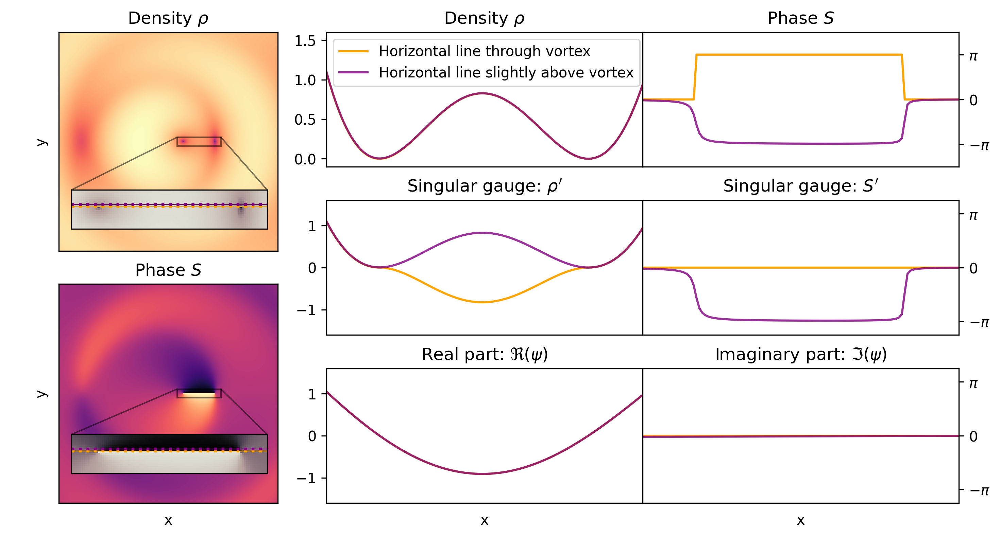

In [66]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from scipy.special import j1
import matplotlib.patheffects as PathEffects
import matplotlib.colors as mcolors

import colorsys
# Function to generate the complex wave function based on the Schrödinger equation
def generate_wave_function(x, y, VorPairLin_kx=1, VorPairLin_ky=1, time=0):
    VorPairRot_Omega = 90
    VorPairRot_Phase0 = 0
    VorPairRot_J1Amp = 5
    VorPairRot_BgAmp = 2
    dx = x
    dy = y
    phase = np.arctan2(dy, dx) - VorPairRot_Omega * time + VorPairRot_Phase0
    R = np.sqrt(dx ** 2 + dy ** 2)
    J1 = VorPairRot_J1Amp * j1(np.sqrt(2.0 * ELBDM_ETA * VorPairRot_Omega) * R)
    Re = VorPairRot_BgAmp - J1 * np.cos(phase)
    Im = -J1 * np.sin(phase)
    return Re + 1j * Im

Time = 0.0  # Example time moment
ELBDM_ETA = 1.0  # Just an example value, adjust according to your setup

N = 512
Nh = 256
# Grid setup
x = np.linspace(-0.5, 0.5, N, endpoint=False)
y = np.linspace(-0.5, 0.5, N, endpoint=False)
X, Y = np.meshgrid(x, y)

# Wave function computation
psi = generate_wave_function(X, Y)
Re, Im = np.real(psi), np.imag(psi)

# Density calculation
density = Re**2 + Im**2
phase   = np.arctan2(Im, Re)

plot_width = 12
plot_height_double = 6
plot_dpi = 300

print(x[Nh], x[Nh+1])

fig = plt.figure(figsize=(plot_width, plot_height_double), dpi=plot_dpi)
gs = gridspec.GridSpec(3, 3, height_ratios=[1, 1, 1], width_ratios=[1, 1, 1], hspace=0.25, wspace=0.0)

# Main subplot that spans all three rows in the first column
main_ax = fig.add_subplot(gs[:, 0])
main_ax.set_xticks([])
main_ax.set_yticks([])
main_ax.spines['top'].set_visible(False)
main_ax.spines['right'].set_visible(False)
main_ax.spines['bottom'].set_visible(False)
main_ax.spines['left'].set_visible(False)

# Nested GridSpec within the main subplot
nested_gs = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=main_ax, hspace=0.15)

x0, x1 = 0.54, 0.74
y0, y1 = 0.48, 0.52

def desaturate_color(color, factor=0.5):
    """Desaturate a single color."""
    r, g, b = mcolors.to_rgb(color)
    h, l, s = colorsys.rgb_to_hls(r, g, b)
    return colorsys.hls_to_rgb(h, l, s * factor)

def desaturate_cmap(cmap, factor=0.5):
    """Desaturate a colormap by the given factor."""
    return mcolors.LinearSegmentedColormap.from_list(
        f'{cmap.name}_desat',
        [desaturate_color(c, factor) for c in cmap(np.linspace(0, 1, cmap.N))]
    )

# Desaturate the 'magma' colormap
desaturated_magma = desaturate_cmap(plt.cm.magma, factor=0.15)
# Two subplots within the main subplot
data = [density, phase]
axes = []
for i in range(2):
    ax = fig.add_subplot(nested_gs[i, 0])
    if i == 0:
        ax.imshow(np.log(data[i]), cmap="magma", extent=(0, 1, 0, 1), origin="lower")
        ax.set_title(r"Density $\rho$")
    else:
        ax.imshow(data[i], cmap="magma", extent=(0, 1, 0, 1), origin="lower")
        ax.set_title(r"Phase $S$")
    ax.set_aspect('equal')
    ax.set_xticks([])
    ax.set_yticks([])
    axes.append(ax)

    # Add zoom-in insets
    ax_inset = fig.add_axes([0.175, 0.5- i*0.4, 0.16, 0.18])
    if i == 0:
        ax_inset.imshow(np.log(data[i][int(y0*N):int(y1*N), int(x0*N):int(x1*N)]), cmap=desaturated_magma, extent=(x0, x1, y0, y1), origin="lower")
    else:
        ax_inset.imshow(data[i][int(y0*N):int(y1*N), int(x0*N):int(x1*N)], cmap=desaturated_magma, extent=(x0, x1, y0, y1), origin="lower")

    ax_inset.set_xticks([])
    ax_inset.set_yticks([])

    # Add dashed lines
    yh1 = 0.0
    yh2 = 0.001953125
    line_purple = ax_inset.axhline(yh1 + 0.503, color='orange', linestyle='dotted', linewidth=2)
    line_purple = ax_inset.axhline(yh1 + 0.503, color='orange', linestyle='-', linewidth=0.5)
    #line_purple.set_path_effects([PathEffects.withStroke(linewidth=1.5, foreground='white')])
    line_orange = ax_inset.axhline(yh2 + 0.503, color='purple', linestyle='dotted', linewidth=2)
    line_orange = ax_inset.axhline(yh2 + 0.503, color='purple', linestyle='-', linewidth=0.5)
    #line_orange.set_path_effects([PathEffects.withStroke(linewidth=1.5, foreground='white')])

    # Indicate zoom region
    ax.indicate_inset_zoom(ax_inset, edgecolor="black")

# Create the right two columns for 1D data visualization
for i in range(2):
    for j in range(3):
        ax = fig.add_subplot(gs[j, i+1])
        if j == 0:
            ax.set_ylim([-0.1, 1.6]) if i == 0 else ax.set_ylim([-1.5*np.pi, 1.5*np.pi])
            if i == 1:
                ax.set_yticks([-np.pi, 0, np.pi], [r"$-\pi$", "$0$", r"$\pi$"])
        elif j == 1 or j == 2:
            ax.set_ylim([-1.6, 1.6]) if i == 0 else ax.set_ylim([-1.25*np.pi, 1.25*np.pi])
            if i == 1:
                ax.set_yticks([-np.pi, 0, np.pi], [r"$-\pi$", "$0$", r"$\pi$"])
        for p, y_index in enumerate([Nh, Nh+1]):
            x = np.linspace(0, 1, N)
            r = data[0][y_index, :].copy()
            s = data[1][y_index, :].copy()
            if j == 1:
                for k in range(1, len(s)):
                    if np.abs(s[k] - s[k-1]) > np.pi * 0.9:
                        s[k:] -= np.pi * np.sign(s[k] - s[k-1])
                        r[k:] *= -1
            elif j == 2:
                b = np.sqrt(r)
                r = b * np.cos(s)
                s = b * np.sin(s)
            y = r if i == 0 else s
            color = 'orange' if p == 0 else 'purple'
            alpha = 1.0 if p == 0 else 0.8
            ax.plot(x, y, lw=1.5, color=color, alpha=alpha)
        if i == 0 and j == 0:
            ax.legend(["Horizontal line through vortex", "Horizontal line slightly above vortex"])
        if i == 1:
            ax.yaxis.set_label_position("right")
            ax.yaxis.tick_right()
        label = [r"Density $\rho$", r"Phase $S$", r"Singular gauge: $\rho'$", r"Singular gauge: $S'$", r"Real part: $\Re(\psi)$", r"Imaginary part: $\Im(\psi)$"]
        ax.set_title(label[i + 2*j])
        ax.set_xlim(0.53, 0.75)
        ax.set_xticks([])
        if j == 2:
            ax.set_xlabel("x")  # Add x label only for the bottom plots

# Adding x and y labels for the left two panels
#axes[0].set_xlabel("x")
axes[0].set_ylabel("y")
axes[1].set_xlabel("x")
axes[1].set_ylabel("y")

plt.savefig("plots/xy_interpolation.pdf", bbox_inches='tight')
plt.show()


/tmp/ipykernel_11800/3614283965.py:57: RuntimeWarning: divide by zero encountered in divide
  C1 = np.abs((C11 + C12) / 2 / sqrt_density[1:-1, 1:-1])


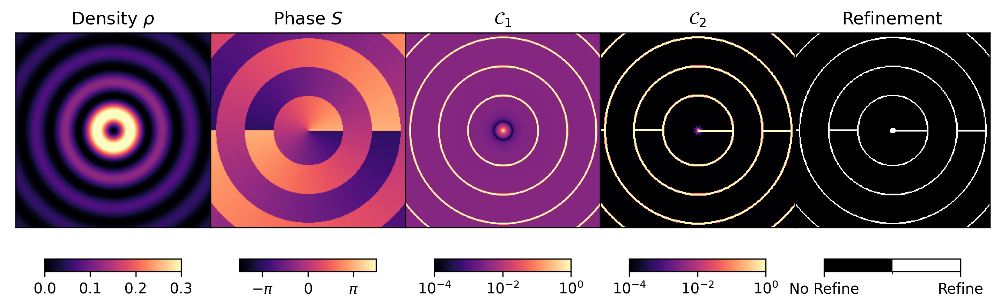

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from scipy.special import j1
import matplotlib.colors as mcolors
from matplotlib.colors import LogNorm

# Function to generate the complex wave function based on the Schrödinger equation
def generate_wave_function(x, y, VorPairLin_kx=1, VorPairLin_ky=1, time=0):
    # Given parameters
    if 0:
        VorPairLin_BgAmp = 1
        VorPairLin_WaveAmp = 1.0
        VorPairLin_Phase0 = 0.0
        VorPairLin_Omega = 0.5  # Simplified for demonstration

        phase = VorPairLin_kx * x - VorPairLin_Omega * time + VorPairLin_Phase0
        amp = VorPairLin_WaveAmp * np.cos(VorPairLin_ky * y)
        Re = VorPairLin_BgAmp + amp * np.cos(phase)
        Im = amp * np.sin(phase)
        return Re + 1j * Im

    else:
        VorPairRot_Omega = 90
        VorPairRot_Phase0 = 0
        VorPairRot_J1Amp = 1
        VorPairRot_BgAmp = 0
        ELBDM_ETA = 1

        dx = x
        dy = y
        phase = np.arctan2(dy, dx) - VorPairRot_Omega * time + VorPairRot_Phase0
        R = np.sqrt(dx ** 2 + dy ** 2)
        J1 = VorPairRot_J1Amp * j1(np.sqrt(2.0 * ELBDM_ETA * VorPairRot_Omega) * R)
        Re = VorPairRot_BgAmp - J1 * np.cos(phase)
        Im = -J1 * np.sin(phase)
        return Re + 1j * Im

N = 256
# Grid setup
x = np.linspace(-0.8, 0.8, N, endpoint=False)
y = np.linspace(-0.8, 0.8, N, endpoint=False)
X, Y = np.meshgrid(x, y)

# Wave function computation
psi = generate_wave_function(X, Y)
Re, Im = np.real(psi), np.imag(psi)

# Density calculation
density = Re**2 + Im**2
phase = np.arctan2(Im, Re)

# Calculate C1
sqrt_density = np.sqrt(density)
C11 = np.diff(sqrt_density, n=2, axis=0)[:, 1:-1]
C12 = np.diff(sqrt_density, n=2, axis=1)[1:-1, :]
C1 = np.abs((C11 + C12) / 2 / sqrt_density[1:-1, 1:-1])

# Calculate C2
C21 = np.diff(phase, n=2, axis=0)[:, 1:-1]
C22 = np.diff(phase, n=2, axis=1)[1:-1, :]
C2 = np.abs((C21 + C22) / 2)

# Sum of C1_avg and C2_avg
C3 = ((C1 > 0.03) + (C2 > 1.0)) > 0

# Define the discrete colormap
cmap_discrete = mcolors.ListedColormap(['black', 'white'])
bounds_discrete = [0, 0.5, 1]
norm_discrete = mcolors.BoundaryNorm(bounds_discrete, cmap_discrete.N)

cmap = "magma"

# Create a figure with three subplots
fig = plt.figure(figsize=(12, 6), dpi=300)
gs = gridspec.GridSpec(2, 5, height_ratios=[10, 0.01], hspace=0.0, wspace=0.0)

# Function to adjust colorbar position and width
def add_colorbar(ax, im, width_shrink=0.75, pad=0.05, orientation='horizontal'):
    # Calculate new width and position
    ax_pos = ax.get_position()
    width = ax_pos.width * width_shrink
    x_position = ax_pos.x0 + (ax_pos.width - width) / 2  # Center the smaller colorbar
    cax = fig.add_axes([x_position, ax_pos.y0 - pad - 0.02, width, 0.02])
    return plt.colorbar(im, cax=cax, orientation=orientation)

# Add subplots
for i, data in enumerate([density, phase, C1, C2, C3]):
    ax = fig.add_subplot(gs[0, i])
    if i == 0:
        im = ax.imshow(data, cmap=cmap, vmax=0.3)
        cbar = add_colorbar(ax, im, width_shrink=0.7)
        ax.set_title(r'Density $\rho$')
    elif i == 1:
        im = ax.imshow(data, cmap=cmap, vmin=-np.pi * 1.5, vmax=np.pi * 1.5)
        cbar = add_colorbar(ax, im, width_shrink=0.7)
        ax.set_title(r'Phase $S$')
        cbar.ax.set_xticks([-np.pi, 0, np.pi])
        cbar.ax.set_xticklabels([r'$-\pi$', r'$0$', r'$\pi$'])
    elif i == 2:
        im = ax.imshow(data, cmap=cmap, norm=LogNorm(vmin=1e-4, vmax=1e0))
        cbar = add_colorbar(ax, im, width_shrink=0.7)
        ax.set_title(r'$\mathcal{C}_1$')
    elif i == 3:
        im = ax.imshow(data, cmap=cmap, norm=LogNorm(vmin=1e-4, vmax=1e0))
        cbar = add_colorbar(ax, im, width_shrink=0.7)
        ax.set_title(r'$\mathcal{C}_2$')
    elif i == 4:
        im = ax.imshow(data, cmap=cmap_discrete, norm=norm_discrete)
        cbar = add_colorbar(ax, im, width_shrink=0.7)
        ax.set_title('Refinement')
        cbar.ax.set_xticks([0, 1])
        cbar.ax.set_xticklabels(["No Refine", "Refine"])

    ax.set_xticks([])
    ax.set_yticks([])

plt.savefig("plots/interference.pdf", bbox_inches='tight')
plt.show()


# Spectral refinement

[30999.99999999992, 27596.667648796083, 24566.96984897134, 21869.887163227762, 19468.903469686124, 17331.511565787845, 15428.773049429486, 13734.926518510007, 12227.038784256716, 10884.694376066851, 9689.719134033505, 8625.934146842068, 7678.936703574288, 6835.905293699423, 6085.426015124824, 5417.338040023807, 4822.596046184453, 4293.147751320986, 3821.8248922703933, 3402.2461730284676, 3028.73086762759, 2696.2219081151225, 2400.2174163114887, 2136.709752348403, 1902.131254758078, 1693.3059374821414, 1507.406489820256, 1341.915997135745, 1194.5938640502616, 1063.4454787576224, 946.6952077383559, 842.7623552472089, 750.2397620862566, 667.8747539098819, 594.5521811184698, 529.2793207159127, 471.17243571540774, 419.44481011973863, 373.39609748022167, 332.4028388231991, 295.9100215651676, 263.42356513167886, 234.50363154193434, 208.75867039027474, 185.84011759887113, 165.4376761673954, 147.27511502518644, 131.1065291060742, 116.71301001056614, 103.89968217910388, 92.49306444878334, 82.338

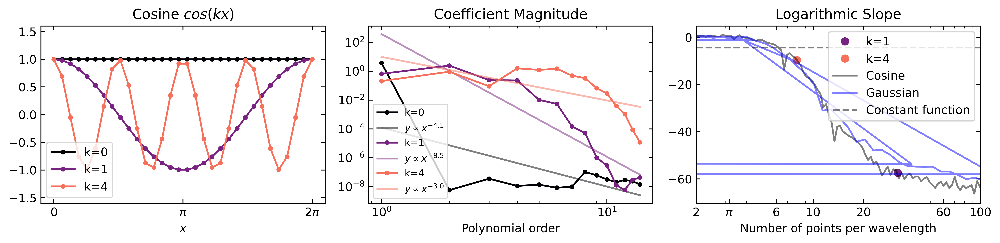

In [59]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec



# GramFE parameters for extension of size 14
FLAG_SPECTRAL_ORDER = 14
FLAG_SPECTRAL_NDELTA = 14
FLAG_SPECTRAL_ND = 32


flag_spectral_polynomials = np.array([
[0.2672612419124243965384835064469370990991592407226562500000000000, 0.2672612419124243965384835064469370990991592407226562500000000000, 0.2672612419124243965384835064469370990991592407226562500000000000, 0.2672612419124243965384835064469370990991592407226562500000000000, 0.2672612419124243965384835064469370990991592407226562500000000000, 0.2672612419124243965384835064469370990991592407226562500000000000, 0.2672612419124243965384835064469370990991592407226562500000000000, 0.2672612419124243965384835064469370990991592407226562500000000000, 0.2672612419124243965384835064469370990991592407226562500000000000, 0.2672612419124243965384835064469370990991592407226562500000000000, 0.2672612419124243965384835064469370990991592407226562500000000000, 0.2672612419124243965384835064469370990991592407226562500000000000, 0.2672612419124243965384835064469370990991592407226562500000000000, 0.2672612419124243965384835064469370990991592407226562500000000000],
[-0.4309458036856673168735198942158604040741920471191406250000000000, -0.3646464492724877382023862537607783451676368713378906250000000000, -0.2983470948593081595312526133056962862610816955566406250000000000, -0.2320477404461285531045433572217007167637348175048828125000000000, -0.1657483860329489744334097167666186578571796417236328125000000000, -0.0994490316197693818844882684970798436552286148071289062500000000, -0.0331496772065897962744607241347694071009755134582519531250000000, 0.0331496772065897962744607241347694071009755134582519531250000000, 0.0994490316197693818844882684970798436552286148071289062500000000, 0.1657483860329489744334097167666186578571796417236328125000000000, 0.2320477404461285531045433572217007167637348175048828125000000000, 0.2983470948593081595312526133056962862610816955566406250000000000, 0.3646464492724877382023862537607783451676368713378906250000000000, 0.4309458036856673168735198942158604040741920471191406250000000000],
[0.4818120558297157574045854744326788932085037231445312500000000000, 0.2594372608313854078332383323868270963430404663085937500000000000, 0.0741249316661101165237823806819505989551544189453125000000000000, -0.0741249316661101165237823806819505989551544189453125000000000000, -0.1853123291652752913094559517048764973878860473632812500000000000, -0.2594372608313854078332383323868270963430404663085937500000000000, -0.2964997266644404660951295227278023958206176757812500000000000000, -0.2964997266644404660951295227278023958206176757812500000000000000, -0.2594372608313854078332383323868270963430404663085937500000000000, -0.1853123291652752913094559517048764973878860473632812500000000000, -0.0741249316661101165237823806819505989551544189453125000000000000, 0.0741249316661101165237823806819505989551544189453125000000000000, 0.2594372608313854078332383323868270963430404663085937500000000000, 0.4818120558297157574045854744326788932085037231445312500000000000],
[-0.4585783658733355583336788185988552868366241455078125000000000000, -0.0352752589133335028859228543751669349148869514465332031250000000, 0.2116515534800010311933249340654583647847175598144531250000000000, 0.3142704885006075699038774473592638969421386718750000000000000000, 0.3046499633424257225122744330292334780097007751464843750000000000, 0.2148583951993949803238592721754685044288635253906250000000000000, 0.0769642012654549179107021927848109044134616851806640625000000000, -0.0769642012654549179107021927848109044134616851806640625000000000, -0.2148583951993949803238592721754685044288635253906250000000000000, -0.3046499633424257225122744330292334780097007751464843750000000000, -0.3142704885006075699038774473592638969421386718750000000000000000, -0.2116515534800010311933249340654583647847175598144531250000000000, 0.0352752589133335028859228543751669349148869514465332031250000000, 0.4585783658733355583336788185988552868366241455078125000000000000],
[0.3875694570442999031811837085115257650613784790039062500000000000, -0.2086912461007768837539799733349354937672615051269531250000000000, -0.3577564218870460943655587016110075637698173522949218750000000000, -0.2493453849515775699874353676932514645159244537353515625000000000, -0.0352335870040272683412219123511022189632058143615722656250000000, 0.1707473831733629099360882719338405877351760864257812500000000000, 0.2927097997257649963920300706377020105719566345214843750000000000, 0.2927097997257649963920300706377020105719566345214843750000000000, 0.1707473831733629099360882719338405877351760864257812500000000000, -0.0352335870040272683412219123511022189632058143615722656250000000, -0.2493453849515775699874353676932514645159244537353515625000000000, -0.3577564218870460943655587016110075637698173522949218750000000000, -0.2086912461007768837539799733349354937672615051269531250000000000, 0.3875694570442999031811837085115257650613784790039062500000000000],
[-0.2948961391092899120280890201684087514877319335937500000000000000, 0.3856334126813791285393051566643407568335533142089843750000000000, 0.2722118207162676495336484094877960160374641418457031250000000000, -0.0577419013640567690970328840194270014762878417968750000000000000, -0.2866472960572818418079066304926527664065361022949218750000000000, -0.2990205606352939748937558306352002546191215515136718750000000000, -0.1237326457801216500476115811579802539199590682983398437500000000, 0.1237326457801216500476115811579802539199590682983398437500000000, 0.2990205606352939748937558306352002546191215515136718750000000000, 0.2866472960572818418079066304926527664065361022949218750000000000, 0.0577419013640567690970328840194270014762878417968750000000000000, -0.2722118207162676495336484094877960160374641418457031250000000000, -0.3856334126813791285393051566643407568335533142089843750000000000, 0.2948961391092899120280890201684087514877319335937500000000000000],
[0.2027563273040598468277551091887289658188819885253906250000000000, -0.4523025762936719873508195632894057780504226684570312500000000000, -0.0155966405618507587826915283812923007644712924957275390625000000, 0.3218579461400111196844875394162954762578010559082031250000000000, 0.2623071367220354832561213243025122210383415222167968750000000000, -0.0354469103678426294967707121941202785819768905639648437500000000, -0.2835752829427410359741656975529622286558151245117187500000000000, -0.2835752829427410359741656975529622286558151245117187500000000000, -0.0354469103678426294967707121941202785819768905639648437500000000, 0.2623071367220354832561213243025122210383415222167968750000000000, 0.3218579461400111196844875394162954762578010559082031250000000000, -0.0155966405618507587826915283812923007644712924957275390625000000, -0.4523025762936719873508195632894057780504226684570312500000000000, 0.2027563273040598468277551091887289658188819885253906250000000000],
[-0.1257441362172087295778766247167368419468402862548828125000000000, 0.4159229121030749709575502492953091859817504882812500000000000000, -0.2611608982972796755284150549414334818720817565917968750000000000, -0.3104033572354872316800822318327846005558967590332031250000000000, 0.0835363142701736199891016099172702524811029434204101562500000000, 0.3297486089612116644254058428487041965126991271972656250000000000, 0.1758659247793128987957800291042076423764228820800781250000000000, -0.1758659247793128987957800291042076423764228820800781250000000000, -0.3297486089612116644254058428487041965126991271972656250000000000, -0.0835363142701736199891016099172702524811029434204101562500000000, 0.3104033572354872316800822318327846005558967590332031250000000000, 0.2611608982972796755284150549414334818720817565917968750000000000, -0.4159229121030749709575502492953091859817504882812500000000000000, 0.1257441362172087295778766247167368419468402862548828125000000000],
[0.0699086407042275592704783093722653575241565704345703125000000000, -0.3172776770422635062018912321946118026971817016601562500000000000, 0.4248294319718443623479231519013410434126853942871093750000000000, 0.0376431142253532968755536103344638831913471221923828125000000000, -0.3495432035211377685968159312324132770299911499023437500000000000, -0.1344396936619760840603277074478683061897754669189453125000000000, 0.2688793873239521681206554148957366123795509338378906250000000000, 0.2688793873239521681206554148957366123795509338378906250000000000, -0.1344396936619760840603277074478683061897754669189453125000000000, -0.3495432035211377685968159312324132770299911499023437500000000000, 0.0376431142253532968755536103344638831913471221923828125000000000, 0.4248294319718443623479231519013410434126853942871093750000000000, -0.3172776770422635062018912321946118026971817016601562500000000000, 0.0699086407042275592704783093722653575241565704345703125000000000],
[-0.0344591278812576007339885109104216098785400390625000000000000000, 0.2041040651428334962158572807311429642140865325927734375000000000, -0.4320644495880761049022567021893337368965148925781250000000000000, 0.2836251294841972137028562883642734959721565246582031250000000000, 0.2359124908793789887617720069101778790354728698730468750000000000, -0.2783237251947729418155574876436730846762657165527343750000000000, -0.2385631930240910969498457916415645740926265716552734375000000000, 0.2385631930240910969498457916415645740926265716552734375000000000, 0.2783237251947729418155574876436730846762657165527343750000000000, -0.2359124908793789887617720069101778790354728698730468750000000000, -0.2836251294841972137028562883642734959721565246582031250000000000, 0.4320644495880761049022567021893337368965148925781250000000000000, -0.2041040651428334962158572807311429642140865325927734375000000000, 0.0344591278812576007339885109104216098785400390625000000000000000],
[0.0147897728358395794817647939112248423043638467788696289062500000, -0.1103544588520337932369130840015714056789875030517578125000000000, 0.3276503520555230086763742747280048206448554992675781250000000000, -0.4459685347422396306527048182033468037843704223632812500000000000, 0.1422093541907651914613097687833942472934722900390625000000000000, 0.3174112785537879233288549585267901420593261718750000000000000000, -0.2457377640416422426294928982315468601882457733154296875000000000, -0.2457377640416422426294928982315468601882457733154296875000000000, 0.3174112785537879233288549585267901420593261718750000000000000000, 0.1422093541907651914613097687833942472934722900390625000000000000, -0.4459685347422396306527048182033468037843704223632812500000000000, 0.3276503520555230086763742747280048206448554992675781250000000000, -0.1103544588520337932369130840015714056789875030517578125000000000, 0.0147897728358395794817647939112248423043638467788696289062500000],
[-0.0053617479838052716639706929413478064816445112228393554687500000, 0.0490806161594482537324779514165129512548446655273437500000000000, -0.1913731588065881450422267562316847033798694610595703125000000000, 0.3992440037171925415471207543305354192852973937988281250000000000, -0.4310020494674237645504888405412202700972557067871093750000000000, 0.0952741372506936690101042586320545524358749389648437500000000000, 0.3266541848595211350314571063790936022996902465820312500000000000, -0.3266541848595211350314571063790936022996902465820312500000000000, -0.0952741372506936690101042586320545524358749389648437500000000000, 0.4310020494674237645504888405412202700972557067871093750000000000, -0.3992440037171925415471207543305354192852973937988281250000000000, 0.1913731588065881450422267562316847033798694610595703125000000000, -0.0490806161594482537324779514165129512548446655273437500000000000, 0.0053617479838052716639706929413478064816445112228393554687500000],
[0.0015503894602372355823738381275234132772311568260192871093750000, -0.0170542840626095905387504814143539988435804843902587890625000000, 0.0837210308528107266523576868166856002062559127807617187500000000, -0.2387599768765342744814006437081843614578247070312500000000000000, 0.4263571015652398155104663146630628034472465515136718750000000000, -0.4604656696904589896490733735845424234867095947265625000000000000, 0.2046514087513151003427935847867047414183616638183593750000000000, 0.2046514087513151003427935847867047414183616638183593750000000000, -0.4604656696904589896490733735845424234867095947265625000000000000, 0.4263571015652398155104663146630628034472465515136718750000000000, -0.2387599768765342744814006437081843614578247070312500000000000000, 0.0837210308528107266523576868166856002062559127807617187500000000, -0.0170542840626095905387504814143539988435804843902587890625000000, 0.0015503894602372355823738381275234132772311568260192871093750000],
[-0.0003100778920474471056327459006496383153717033565044403076171875, 0.0040310125966168128611166743269222934031859040260314941406250000, -0.0241860755797008754319765699847266660071909427642822265625000000, 0.0886822771255698777403964072618691716343164443969726562500000000, -0.2217056928139246874120971142474445514380931854248046875000000000, 0.3990702470650644428928899287711828947067260742187500000000000000, -0.5320936627534192941979540592001285403966903686523437500000000000, 0.5320936627534192941979540592001285403966903686523437500000000000, -0.3990702470650644428928899287711828947067260742187500000000000000, 0.2217056928139246874120971142474445514380931854248046875000000000, -0.0886822771255698777403964072618691716343164443969726562500000000, 0.0241860755797008754319765699847266660071909427642822265625000000, -0.0040310125966168128611166743269222934031859040260314941406250000, 0.0003100778920474471056327459006496383153717033565044403076171875],
])


# Define least squares regression function
def least_squares_regression(x, y, start, end):
    x, y = np.asarray(x), np.asarray(y)
    x = x[start:end]
    y = y[start:end]
    n = len(x)
    sum_x = np.sum(x)
    sum_y = np.sum(y)
    sum_x_squared = np.sum(x ** 2)
    sum_xy = np.sum(x * y)
    slope = (n * sum_xy - sum_x * sum_y) / (n * sum_x_squared - sum_x ** 2)
    intercept = (sum_y - slope * sum_x) / n
    return slope, intercept



def calculate_slope(y, convergence_threshold = -32.0, linear_slope = -5.0, max_order = 14, floor=1e-16, precision=np.double):
    al_re     = np.zeros(max_order)
    row_re    = np.real(y)
    order     = np.arange(1, max_order+1)


    # Machine epsilon for single precision
    epsilon = np.finfo(precision).eps

    # Calculate polynomial coefficients
    for i in range(max_order):
        data = row_re[:max_order].astype(precision)
        noisy_data = data + np.random.uniform(-epsilon/2, epsilon/2, size=data.shape)
        al_re[i] = np.dot(flag_spectral_polynomials[i], noisy_data)  # simplified for clarity

    al_re_log = np.log10(np.abs(al_re) + floor)
    al_re_log += 1/(1+np.exp(al_re_log-convergence_threshold)) * linear_slope * (order-1)

    slope, intercept = least_squares_regression(np.log10(order), al_re_log, start=0, end=max_order)

    return order, al_re_log, slope, intercept

def gaussian_wave_packet_1d(t, x, Gau_v0, Gau_Width, Gau_Center):
    # Define constants
    ELBDM_ETA = 1.0  # Example value for ELBDM_ETA

    # Calculate the required constants
    Gau_Const1 = 1.0 + (t / (ELBDM_ETA * Gau_Width**2))**2
    Gau_Theta1 = -0.5 * np.arctan(t / (ELBDM_ETA * Gau_Width**2))

    # Calculate the wave packet
    dr1 = x - Gau_v0 * t - Gau_Center
    dr2 = x - 0.5 * Gau_v0 * t - Gau_Center
    Gau_Const2 = (Gau_Width**2 * np.pi * Gau_Const1)**(-0.25) * np.exp(-0.5 * (dr1 / Gau_Width)**2 / Gau_Const1)
    Gau_Theta2 = (0.5 * dr1**2 * ELBDM_ETA * t / ((ELBDM_ETA * Gau_Width**2)**2 + t**2) + Gau_v0 * ELBDM_ETA * dr2)

    Re = Gau_Const2 * np.cos(Gau_Theta1 + Gau_Theta2)
    Im = Gau_Const2 * np.sin(Gau_Theta1 + Gau_Theta2)
    PPW = 2*np.pi/np.max(np.diff(np.unwrap(np.angle(Re + 1j*Im))))
    return Re + 1j * Im, PPW



# Sample data
size_1d = 32
x = np.linspace(0, 2 * np.pi, size_1d)
ks = [0, 1, 4]  # Different values of k for the third plot
ys = [np.exp(1j * x * k) for k in ks]

prec = np.single

#ys = []
#for k in [0.1, 2, 8]:
#    psi, ppw = gaussian_wave_packet_1d(0, x, k, 2, np.pi)
#    ys.append(np.real(psi))
#colors = ['b', 'g', 'r']  # Colors for different k values
colors = plt.cm.magma(np.array([0, 0.35, 0.7]))
convergence_threshold =  -6
fig = plt.figure(figsize=(plot_width, plot_height_single), dpi=plot_dpi)
gs = GridSpec(1, 3)

# Plot 1: y over x
ax1 = fig.add_subplot(gs[0, 0])
for i in range(len(ks)):
    ax1.plot(x, np.real(ys[i]), '.-', label=f'k={ks[i]}', color=colors[i])
ax1.set_xticks([0, np.pi, 2*np.pi], [r"$0$", r"$\pi$", r"$2\pi$"])
ax1.set_xlabel(r'$x$')
ax1.set_ylim([-1.6, 1.6])
ax1.set_title(r'Cosine $cos(k x)$')
ax1.legend(loc="lower left")



# Plot 2: Polynomial coefficients and decay
ax2 = fig.add_subplot(gs[0, 1])


for i in range(len(ks)):
    order, al_re_log, slope, intercept = calculate_slope(ys[i], precision = prec)
    ax2.plot(order, 10**al_re_log, '.-', label=f'k={ks[i]}', color=colors[i])
    ax2.plot(order, 10**(intercept) * order**slope, label=r'$y \propto x^{' + f'{slope:.1f}' + r'}$', color=colors[i], alpha=0.5)
ax2.legend(loc="lower left", fontsize="small")
ax2.set_xlabel('Polynomial order')
ax2.set_title('Coefficient Magnitude')
ax2.set_yscale('log')
ax2.set_xscale('log')

# Plot 2: Polynomial coefficients and decay
#ax3 = fig.add_subplot(gs[0, 2])
#for i in range(len(ks)):
#    order, al_re_log, slope, intercept = calculate_slope(ys[i], convergence_threshold=convergence_threshold, precision = prec)
#    ax3.plot(order, 10**al_re_log, '.-', label=f'k={ks[i]}', color=colors[i])
#    ax3.plot(order, 10**(intercept) * order**slope, label=r'$y \propto x^{' + f'{slope:.1f}' + r'}$', color=colors[i], alpha=0.5)
#ax3.legend(loc="lower left", fontsize="small")
#ax3.set_xlabel('Polynomial order')
#ax3.set_title('Coefficient Magnitude')
#ax3.set_yscale('log')
#ax3.set_xscale('log')

# Plot 3: Slope as a function of k
ax4 = fig.add_subplot(gs[0, 2])
slopes = []
for i in range(len(ks)):
    order, al_re_log, slope, intercept = calculate_slope(ys[i], convergence_threshold=convergence_threshold, precision = prec)
    slopes.append(slope)
    if ks[i]>0:
        ax4.plot(size_1d/ks[i], slope, 'o', color=colors[i], label=f'k={ks[i]}')

slopes = []
ks = np.logspace(-3, 2, 300)
for k in ks:
    y = np.exp(1j * x * k)
    order, al_re_log, slope, intercept = calculate_slope(y, convergence_threshold=convergence_threshold, precision = prec)
    slopes.append(slope)
ax4.plot(size_1d/ks, slopes, c="k", alpha=0.5, label=r"Cosine")


slopes = []
ppws = []
Gau_Width = 2
Gau_Center = np.pi
t = 0

ks = np.logspace(-3, 2, 100)
for k in ks:
    psi, ppw = gaussian_wave_packet_1d(t, x, k, Gau_Width, Gau_Center)
    order, al_re_log, slope, intercept = calculate_slope(np.real(psi), convergence_threshold=convergence_threshold, precision = prec)
    slopes.append(slope)
    ppws.append(ppw)

print(ppws)
print(slopes)
ax4.plot(ppws, slopes, c="b", alpha=0.5, label=r"Gaussian")
#ax3.axvline(x = 5, c="k", ls = "dashed", alpha=0.3)
#ax3.axhline(y = 0, c="k", ls = "dashed", alpha=0.3)
ax4.set_xscale("log")
ax4.set_xlim([2, 20])
ax4.set_xticks([2, np.pi, 6, 10, 20, 60, 100], ["2", "$\pi$", "6", "10", "20", "60", "100"])
#ax4.axvline(6,  ls="dashed", alpha=0.5)
#ax4.axvline(100,ls="dashed", alpha=0.5)
ax4.axhline(-4.3,  ls="dashed", alpha=0.5, label="Constant function")
#ax4.axhline(-16,ls="dashed", alpha=0.5)
#ax3.set_title('Slope of Fit vs. k')
ax4.set_xlabel('Number of points per wavelength')
ax4.set_title('Logarithmic Slope')
ax4.legend()

# Ticks on the inside and on all sides of the plot
ax1.tick_params(direction='in', which='both', top=True, right=True)
ax2.tick_params(direction='in', which='both', top=True, right=True)
#ax3.tick_params(direction='in', which='both', top=True, right=True)
ax4.tick_params(direction='in', which='both', top=True, right=True)

plt.savefig("plots/spectral_refinement.pdf", bbox_inches='tight')
plt.tight_layout()
plt.show()

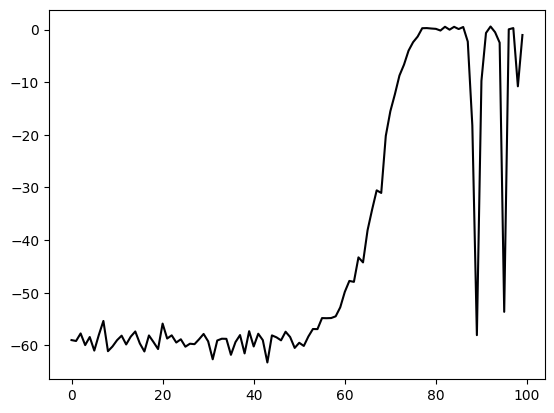

In [60]:
plt.plot(slopes)

# AMR explanation

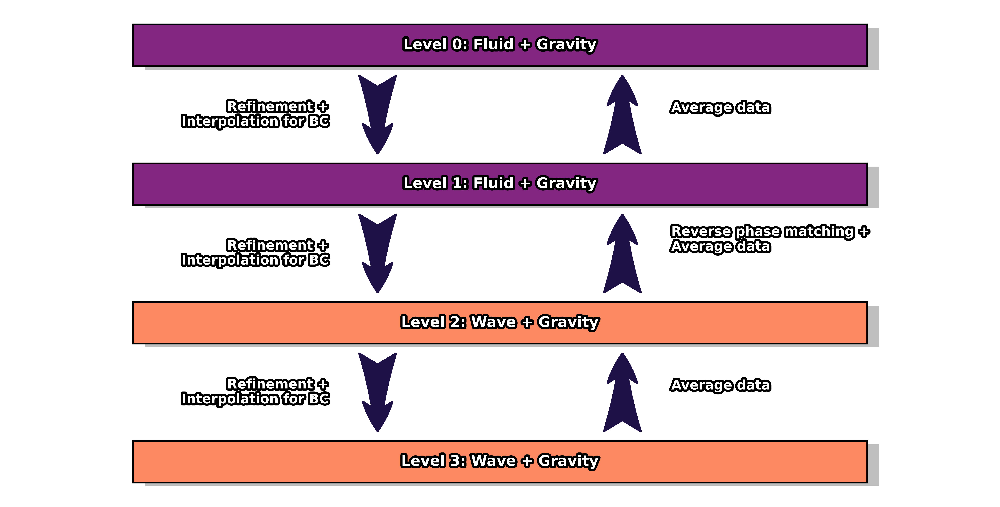

In [6]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.patheffects import Stroke, Normal
from matplotlib import patheffects
c1, c2, c3, c4, c5, c6 = plt.cm.magma(np.array(np.linspace(0, 1, 9)[1:7]))

def draw_block(ax, center, text, shadow=True, fill_color='#4f81bd'):
    """ Draws a single block with text centered inside, optionally with shadow and fill color. """
    # Create the rectangle with sharp corners
    rect = patches.Rectangle((center[0]-1.5, center[1]-0.3), 3, 0.6, linewidth=1, edgecolor='black', facecolor=fill_color, zorder=3)
    ax.add_patch(rect)

    # Optionally add shadow
    if shadow:
        shadow_rect = patches.Rectangle((center[0]-1.45, center[1]-0.35), 3, 0.6, linewidth=0, facecolor='gray', alpha=0.5, zorder=2)
        ax.add_patch(shadow_rect)

    # Add text with outlined effect
    text_effects = [patheffects.withStroke(linewidth=3, foreground='black')]
    ax.text(center[0], center[1], text, ha='center', va='center', fontweight='bold', fontsize=10, color='white', path_effects=text_effects)

def draw_arrow(ax, start, end, text=None, style='->', horizontalalignment='center', verticalalignment='center'):
    """ Draws arrows between blocks and includes text annotations with fancy arrow style. """
    arrow_style = patches.ArrowStyle.Fancy(head_length=2, head_width=2, tail_width=2.5)
    ax.annotate('', xy=end, xycoords='data', xytext=start, textcoords='data',
                arrowprops=dict(arrowstyle=arrow_style, lw=1.5, color=c1))
    if text:
        if horizontalalignment=="center":
            x = (start[0] + end[0]) / 2
        elif horizontalalignment=="left":
            x = end[0] + .2
        elif horizontalalignment=="right":
            x = start[0] - .2
        mid = (x, (start[1] + end[1]) / 2)
        text_effects = [patheffects.withStroke(linewidth=3, foreground='black')]
        ax.text(mid[0], mid[1], text, ha=horizontalalignment, va=verticalalignment, fontsize=9, color='white', fontweight='bold', path_effects=text_effects)

fig, ax = plt.subplots(figsize=(plot_width, plot_height_double), dpi = plot_dpi)

# Define positions for the blocks and labels for AMR levels
levels = ['Level 0', 'Level 1', 'Level 2', 'Level 3']
positions = [(2, 9), (2, 7), (2, 5), (2, 3)]  # x, y positions for each block

# Draw blocks for wave function solvers
solver_labels = [f'{level}: Fluid + Gravity' if i < 2 else f'{level}: Wave + Gravity' for i, level in enumerate(levels)]
for i, (pos, label) in enumerate(zip(positions, solver_labels)):
    draw_block(ax, pos, label, fill_color=c3 if i < 2 else c6)

# Draw arrows for refinement and boundary conditions
refinement_texts = ["Refinement +\nInterpolation for BC",
                    "Refinement +\nInterpolation for BC",
                    "Refinement +\nInterpolation for BC",
                    "Continue to finer levels"]
for i in range(len(positions)-1):
    draw_arrow(ax, (1.5, positions[i][1] - 0.4), (1.5, positions[i+1][1] + 0.4), refinement_texts[i], horizontalalignment='right')

restriction_texts = ["Average data",
                     "Average data",
                     "Reverse phase matching +\nAverage data",
                     "Average data",
                     "Continue to finer levels"]
for i in range(1, len(positions)):
    draw_arrow(ax, (2.5, positions[i][1] + 0.4), (2.5, positions[i-1][1] - 0.4), restriction_texts[i], style='<-', verticalalignment='bottom', horizontalalignment='left')

# "First wave level" annotation and dashed line
#ax.axhline(6, color=c1, label="First wave level", lw=2, alpha=0.4)
#ax.text(2, 6, 'First Wave Level', va='center', ha='center', fontsize=9, fontweight='bold', color=c5, bbox=dict(facecolor='none', edgecolor=c5, boxstyle='round,pad=0.5'))

# Set axis limits and turn off axis visibility
ax.set_xlim(0, 4)
ax.set_ylim(2.5, 9.5)
ax.axis('off')

plt.savefig("plots/amr_information_flow.pdf", bbox_inches='tight')
plt.show()


# Error vs Wavelength

## Combine plane wave data

In [164]:

# Directory where your CSV files are stored
directory_path = 'results'


# Pattern to match CSV files
pattern = os.path.join(directory_path, 'results_*.csv')

# List all CSV files in the directory
csv_files = glob.glob(pattern)

# Initialize an empty DataFrame to store combined data
combined_df = pd.DataFrame()

# Read each CSV file, assign a manual label, and append to combined DataFrame
for file in csv_files:
    # Extract base filename without directory and extension to match with labels
    base_filename = os.path.basename(file)[:-4]  # Remove the last 4 characters (.csv)
    if base_filename in labels:
        # Read CSV file
        df = pd.read_csv(file)
        # Assign label
        df['Label'] = labels[base_filename]
        # Append to combined DataFrame
        combined_df = pd.concat([combined_df, df], ignore_index=True)


# Sort the DataFrame by PWave_NWavelength for consistent plotting
combined_df.sort_values('PWave_NWavelength', inplace=True)

combined_df.to_csv("results/results_planewave_wavelength.csv")

## Gaussian wave packet

### Derive relationship between velocity and minimum wavelength

       Coord.  Numerical  Analytical  Error
NaN  0.003906  -0.926940   -0.926940    0.0
NaN  0.011719  -1.246837   -1.246837    0.0
NaN  0.019531  -1.213561   -1.213561    0.0
NaN  0.027344  -0.774123   -0.774123    0.0
NaN  0.035156  -0.009324   -0.009324    0.0
..        ...        ...         ...    ...
NaN  0.839844  -0.036514   -0.036514    0.0
NaN  0.847656  -0.027151   -0.027151    0.0
NaN  0.855469  -0.001108   -0.001108    0.0
NaN  0.863281   0.039040    0.039040    0.0
NaN  0.871094   0.083242    0.083242    0.0

[128 rows x 4 columns]
       Coord.      Real      Imag     Phase
NaN  0.003906 -0.665369 -0.926940 -2.193377
NaN  0.011719 -0.094574 -1.246837 -1.646502
NaN  0.019531  0.618234 -1.213561 -1.099627
NaN  0.027344  1.254864 -0.774123 -0.552752
NaN  0.035156  1.586448 -0.009324 -0.005877
..        ...       ...       ...       ...
NaN  0.964844  0.140779  0.643545  1.355433
NaN  0.972656 -0.242247  0.703767  1.902308
NaN  0.980469 -0.643331  0.533576  2.449183
NaN  0.9

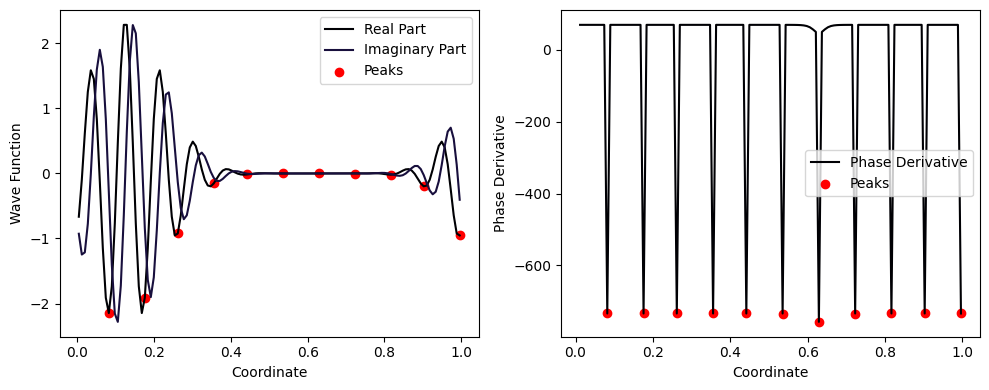

In [76]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Placeholder for reading your CSV (make sure to have your actual path here)
df = pd.read_csv("results/Gaussian_Imag_000000", delimiter=" ")
print(df)
df = df.sort_values(by='Coord.')

# Assuming df is your DataFrame and it has 'Coord.' and 'Analytical' columns
coords = df["Coord."]
imag   = df["Analytical"]

df     = pd.read_csv("results/Gaussian_Real_000000", delimiter=" ")
df     = df.sort_values(by='Coord.')
real   = df["Analytical"]

df = pd.DataFrame({"Coord.": coords, "Real": real, "Imag": imag})
# Calculate the phase of the wave function
df['Phase'] = np.arctan2(df['Imag'], df['Real'])
print(df)

# Calculate the derivative of the phase with respect to the coordinate
# Note: Ensure coordinates are sorted
df = df.sort_values(by='Coord.')
phase_derivative = np.diff(df['Phase'].to_numpy()) / np.diff(df['Coord.'].to_numpy())

# Detect peaks: where the derivative of the phase changes sign
sign_changes = phase_derivative < -100

# Adjust peak indices by +1 due to the way np.diff() reduces array size
peak_indices = np.where(sign_changes)[0] + 1

# Assuming 'df' is your DataFrame with 'Coord.', 'Real', and 'Imag' columns
# and 'peak_indices' contains the indices of identified peaks in the phase

# Extract coordinates of identified peaks
peak_coords = df.iloc[peak_indices]['Coord.']

# Calculate distances between successive peaks
distances_between_peaks = np.diff(peak_coords.to_numpy())

# The minimum wavelength is the smallest of these distances
min_wavelength = np.min(distances_between_peaks) if distances_between_peaks.size > 0 else np.nan

# Output the minimum wavelength
print("Minimum Wavelength:", min_wavelength)

# Plotting for visualization
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.plot(df['Coord.'], df['Real'], label='Real Part')
plt.plot(df['Coord.'], df['Imag'], label='Imaginary Part')
plt.scatter(df.iloc[peak_indices]['Coord.'], df.iloc[peak_indices]['Real'], color='red', label='Peaks')
plt.xlabel('Coordinate')
plt.ylabel('Wave Function')
plt.legend()


# Plotting phase derivative with peaks correctly
plt.subplot(1, 2, 2)
plt.plot(df['Coord.'].iloc[1:], phase_derivative, label='Phase Derivative')  # Adjusted for phase_derivative indexing
# Since peak_indices are for df, align peak_coords for plotting on phase_derivative
plt.scatter(peak_coords, [phase_derivative[i-1] for i in peak_indices], color='red', label='Peaks')  # Corrected
plt.xlabel('Coordinate')
plt.ylabel('Phase Derivative')
plt.legend()

plt.tight_layout()
plt.show()

In [89]:
128/11

11.636363636363637

In [88]:
np.diff(np.unwrap(df['Phase'].to_numpy())), 2*np.pi/(70/128)

(array([0.546875  , 0.546875  , 0.546875  , 0.546875  , 0.546875  ,
        0.546875  , 0.546875  , 0.546875  , 0.546875  , 0.546875  ,
        0.546875  , 0.546875  , 0.546875  , 0.546875  , 0.546875  ,
        0.546875  , 0.546875  , 0.546875  , 0.546875  , 0.546875  ,
        0.546875  , 0.546875  , 0.546875  , 0.546875  , 0.546875  ,
        0.546875  , 0.546875  , 0.546875  , 0.546875  , 0.546875  ,
        0.546875  , 0.546875  , 0.546875  , 0.546875  , 0.546875  ,
        0.546875  , 0.546875  , 0.546875  , 0.546875  , 0.546875  ,
        0.546875  , 0.546875  , 0.546875  , 0.546875  , 0.546875  ,
        0.546875  , 0.546875  , 0.546875  , 0.546875  , 0.546875  ,
        0.546875  , 0.546875  , 0.546875  , 0.546875  , 0.546875  ,
        0.546875  , 0.54687499, 0.54687498, 0.54687495, 0.5468749 ,
        0.54687478, 0.54687452, 0.54687394, 0.54687269, 0.54686995,
        0.54686398, 0.54685092, 0.54682241, 0.54676015, 0.54662422,
        0.5463276 , 0.54568108, 0.54427538, 0.54

In [86]:
0.546875/128

0.0042724609375

In [77]:
min_wavelength

0.0859375

In [79]:
128/(2*np.pi)/70

0.2910261816537515

In [7]:
128 * min_wavelength / 0.077426, 128 * min_wavelength / 0.599484, 128 * min_wavelength / 1.66816

(142.0711388939116, 18.349113571004395, 6.594091693842317)

In [178]:
128 * min_wavelength / 0.077426, 128 * min_wavelength / 0.599484, 128 * min_wavelength / 1.66816

(1280.0, 1.0)


128 * min_wavelength / 0.077426, 128 * min_wavelength / 0.599484, 128 * min_wavelength / 1.66816
142.0711388939116, 18.349113571004395, 6.594091693842317

### Plot error vs minimum wavelength

In [56]:
points_per_wave_length = np.logspace(0, 3, 20)
set((512/points_per_wave_length).astype(int))

{0, 1, 2, 3, 4, 6, 9, 13, 19, 27, 40, 57, 83, 119, 172, 247, 355, 512}

In [63]:
min_wavelength

0.0859375

In [65]:
min_wavelength/0.011

7.812500000000001

In [72]:
2*np.pi/11

0.5711986642890533

In [71]:
128/(1/(2*np.pi/0.011))

73113.42902899883

Plot saved as 'errors_vs_wavelength.pdf'


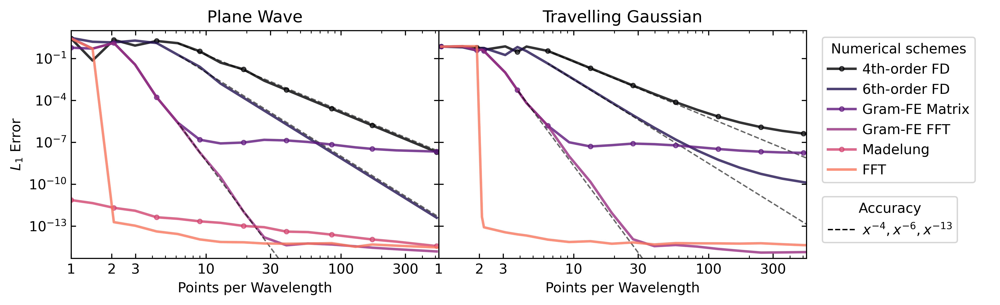

In [107]:

set_cycle(8)

# Define labels for Gaussian data
labels_gaussian = {
    'base_fft_Gau_v0': 'FFT',
    'fd_2_Gau_v0': '4th-order FD',
    'fd_4_Gau_v0': '6th-order FD',
    'gramfe_fft_Gau_v0': 'Gram-FE FFT',
    'gramfe_matmul_Gau_v0': 'Gram-FE Matrix',
    'fluid_Gau_v0': 'Madelung'
}

# Define labels for Plane Wave data
labels_planewave = {
    'base_fft_PWave_NWavelength': 'FFT',
    'fd_2_PWave_NWavelength': '4th-order FD',
    'fd_4_PWave_NWavelength': '6th-order FD',
    'gramfe_fft_PWave_NWavelength': 'Gram-FE FFT',
    'gramfe_matmul_PWave_NWavelength': 'Gram-FE Matrix',
    'fluid_PWave_NWavelength': 'Madelung'
}

markers = {
    'FFT' : "",
    '4th-order FD': ".",
    '6th-order FD': "",
    'Gram-FE FFT': "",
    'Gram-FE Matrix': ".",
    'Madelung': "."
}
# Function to read data and assign labels
def prepare_data(file_path, labels_dict):
    df = pd.read_csv(file_path)
    df['Label'] = df['RunName'].map(labels_dict)
    return df

# Load data
df_gaussian = prepare_data('results/results_gaussian_wavelength.csv', labels_gaussian)
df_planewave = prepare_data('results/results_planewave_wavelength.csv', labels_planewave)

# Set desired order of labels
desired_order = ['4th-order FD', '6th-order FD', 'Gram-FE Matrix', 'Gram-FE FFT', 'Madelung', 'FFT']
df_gaussian['Label'] = pd.Categorical(df_gaussian['Label'], categories=desired_order, ordered=True)
df_planewave['Label'] = pd.Categorical(df_planewave['Label'], categories=desired_order, ordered=True)

# Sort data
df_gaussian.sort_values('Velocity', inplace=True)
df_planewave.sort_values('Wavelength', inplace=True)




# High-resolution plot setup
fig = plt.figure(figsize=(12, 3), dpi=600)

gs = gridspec.GridSpec(1, 3, width_ratios=[1, 1, 0.5], wspace=0.0)

# Assign axes for the plots
ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1])
legend_ax = fig.add_subplot(gs[2])
legend_ax.axis('off')

# Plot data for each label
for i, (test, df) in enumerate(zip(["Plane wave", "Gaussian"], [df_planewave, df_gaussian])):
    ax = [ax1, ax2][i]

    for label, group_df in df.groupby('Label'):

        if test == "Plane wave":
            N_points = 512
            x = N_points / group_df['Wavelength']
            y = 0.5 * (group_df['Error(Dens)'] + group_df['Error(Real)'])

        elif test == "Gaussian":
            N_points = 512
            x = 2*np.pi/(70/N_points)/ group_df['Velocity']
            if label == "Madelung":
                y = group_df['Error(Dens)']
            else:
                y = 0.5 * (group_df['Error(Dens)'] + group_df['Error(Real)'])

        line, = ax.plot(x, y, label=f'{label}', marker=markers[label], fillstyle="none", linestyle='-', lw=1.8, alpha = 0.8, markevery=2)#,, lw=2)
        #line, = ax.plot(x.array[::2], y.array[::2], marker=markers[label], fillstyle="none", linestyle='', alpha = 1, color=line.get_color())

        # Plotting reference lines based on label
        n_start = 15

        ls = ['4th-order FD', '6th-order FD', 'Gram-FE FFT']
        cs = [-4, -6, -13]
        if test == "Gaussian":
            ss = [14, 14, 16]
        else:
            ss = [11, 11, 11]


        for i in range(len(ls)):
            c = cs[i]
            l = ls[i]
            s = ss[i]
            if label == l:
                y_ref = y.iloc[s] * (x.iloc[:s+1]/x.iloc[s])**c
                ax.plot(x.iloc[:s+1], y_ref, 'k--', alpha = 0.6, lw = 1.0)


    # Customize plot
    ax.set_xlabel('Points per Wavelength')
    ax.set_yscale("log")
    ax.set_xscale("log")
    ax.set_ylim([5e-16, 1e1])
    ax.set_xlim([1, 530])
    ax.set_xticks([1, 2, 3, 10, 30, 100, 300], ['1', '2', '3', '10', '30', '100', '300'])
    # Ticks on the inside and on all sides of the plot
    ax.tick_params(direction='in', which='both', top=True, right=True)

ax1.set_ylabel('$L_1$ Error')
ax2.set_yticklabels([])


# Define and place the legend
scheme_handles, scheme_labels = ax1.get_legend_handles_labels()
#accuracy_heading = [Line2D([0], [0], color='none', label='Accuracy')]
accuracy_handles = [Line2D([0], [0], color='k', ls="--", lw=0.5, label=r'$x^{-4}, x^{-6}, x^{-13}$')]
#legend_ax.legend(handles = scheme_handles + accuracy_heading + accuracy_handles, loc='upper left', title="Numerical schemes", handletextpad=0.5, handlelength=2, fancybox=True)

# Assume ax1 and ax2 are already set up as in previous examples
scheme_handles, scheme_labels = ax1.get_legend_handles_labels()

# First legend for "Numerical schemes"
legend1 = legend_ax.legend(scheme_handles, scheme_labels, loc='upper left', bbox_to_anchor=(0.05, 1), title="Numerical schemes", handletextpad=0.5, handlelength=2, fancybox=True)

# Second legend for "Accuracy"
accuracy_handles = [Line2D([0], [0], color='k', ls="--", lw=1.0, label=r'$x^{-4}, x^{-6}, x^{-13}$')]
legend2 = legend_ax.legend(handles = accuracy_handles, loc='upper left', bbox_to_anchor=(0.05, 0.3), title="Accuracy", handletextpad=0.5, handlelength=2, fancybox=True)

legend_ax.add_artist(legend1)
# Disable axis of legend_ax
legend_ax.axis('off')
ax1.set_title("Plane Wave")
ax2.set_title("Travelling Gaussian")
# Show or save the plot
#plt.tight_layout()
plt.savefig('plots/scheme_errors.pdf', bbox_inches='tight')  # Save the plot as a PNG file
# plt.show()  # Uncomment to display the plot instead

print("Plot saved as 'errors_vs_wavelength.pdf'")


In [112]:
2*np.pi/(70/128)/ 0.08

143.61566416410483

In [ ]:

            N_points = 128
            x = N_points * min_wavelength / group_df['Velocity']

In [120]:
points_per_wave_length = np.logspace(0, 3, 20)
set(128*min_wavelength/points_per_wave_length)*4

TypeError: unsupported operand type(s) for *: 'set' and 'int'

In [122]:
arr = 2*np.pi/np.array([0.011,
 0.015822948771164292,
 0.02276051889226269,
 0.032739865857944514,
 0.047094656385913355,
 0.06774330321726293,
 0.09744534694510915,
 0.14017024842734474,
 0.20162787819156802,
 0.2900315988603394,
 0.4171959209805475,
 0.6001154259285372,
 0.8632359673866076,
 1.2417216808531581,
 1.7861544131075937,
 2.569293615999135,
 3.0,
 3.695800114912161,
 5.316223262428928,
 5.5,
 6,
 7.647120757953166,
 11.0])/4

In [123]:
arr.astype(int)

array([142,  99,  69,  47,  33,  23,  16,  11,   7,   5,   3,   2,   1,
         1,   0,   0,   0,   0,   0,   0,   0,   0,   0])

In [185]:
points_per_wave_length = np.logspace(0, 3, 20)
set((512/points_per_wave_length).astype(int))

{0, 1, 2, 3, 4, 6, 9, 13, 19, 27, 40, 57, 83, 119, 172, 247, 355, 512}

# Gaussian lag

/tmp/ipykernel_6583/1465658355.py:135: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/tmp/ipykernel_6583/1465658355.py:141: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.03, 1, 0.95])


Plot saved as plots/gaussian_lag.pdf


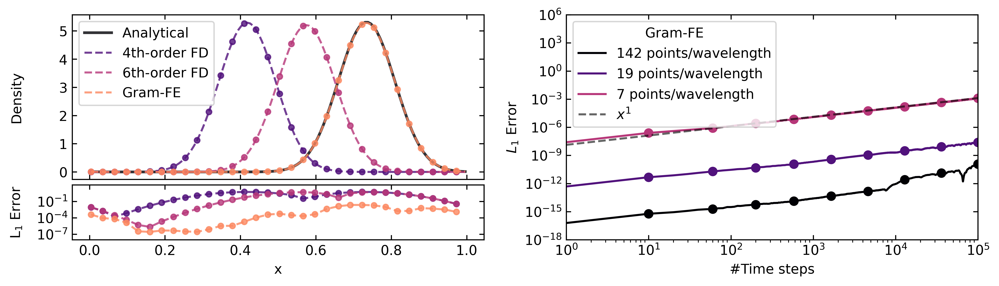

In [14]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec


#### FIRST SUBPLOT ###
def load_and_filter_data(file_path, index_of_interest):
    """Load data from a CSV file and filter it by the specified index."""
    df = pd.read_csv(file_path)
    return df[df['Index'] == index_of_interest]

def plot_density(ax, df, shift, label, l2, linestyle, marker=None, plot_points=False):
    """Plot density data on the provided axis."""
    data = np.roll(df[label], shift)
    line, = ax.plot(df['Coord.'], data, label=l2, linestyle=linestyle, lw=2 if linestyle=="-" else 1.5, alpha=0.8)
    if plot_points:
        ax.plot(df['Coord.'][::4], data[::4], linestyle='', marker=marker, markersize=4, alpha=0.8, color=line.get_color())

def plot_error(ax, df, shift):
    """Plot error data on the provided axis."""
    error = np.roll(abs(df['Numerical'] - df['Analytical']), shift)
    ax.plot(df['Coord.'][::4], error[::4], linestyle='--', marker='o', markersize=4, alpha=0.8)

# Define constants and file paths
CSV_FILENAME = 'results/combined_density_0_10_t=0.5.csv'
INDEX_OF_INTEREST = 5
SHIFT_LEFT = -18

# Load and prepare data
df = load_and_filter_data(CSV_FILENAME, INDEX_OF_INTEREST)

### SECOND SUBPLOT ###

# Define labels for numerical results
labels = {
    "fd_2_results": "4th-order FD",
    "fd_4_results": "6th-order FD",
    "gramfe_fft_results": "Gram-FE",
    "base_fft_results": "FFT",
}
set_cycle(5)
# Set up the figure and subplots
fig = plt.figure(figsize=(12, 3), dpi=600)

main_gs = gridspec.GridSpec(1, 2, width_ratios=[1, 1], wspace=0.2)  # Two columns, different widths
nested_gs = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=main_gs[0], height_ratios=[3, 1], hspace=0.05)
ax1 = fig.add_subplot(nested_gs[0])  # First subplot in the nested GridSpec
ax2 = fig.add_subplot(nested_gs[1], sharex=ax1)  # Second subplot in the nested GridSpec
ax3 = fig.add_subplot(main_gs[1])    # Regular plot in the second column

#Skip first colour
ax2.plot([],[])

# Plot analytical density
df_analytical = df[df['Source'] == df['Source'].unique()[0]].sort_values("Coord.")
plot_density(ax1, df_analytical, SHIFT_LEFT, 'Analytical', 'Analytical', '-', plot_points=False)


# Plot numerical densities and errors
for source, label in labels.items():
    if source == "base_fft_results":
        continue
    df_source = df[df['Source'] == source].sort_values("Coord.")
    plot_density(ax1, df_source, SHIFT_LEFT, 'Numerical', label, '--', 'o', plot_points=True)
    plot_error(ax2, df_source, SHIFT_LEFT)

# Configure axis labels and scales
ax1.set_ylabel('Density')
ax1.legend()
ax2.set_xlabel('x')
ax2.set_ylabel('L$_1$ Error')
ax2.set_yscale('log')
ax2.set_ylim([1e-8, 100])
ax2.set_yticks([1e-1, 1e-4, 1e-7])

# Adjust labels and ticks
ax1.yaxis.set_label_coords(-0.12, 0.5)
ax2.yaxis.set_label_coords(-0.12, 0.5)
ax1.tick_params(axis='both', direction='in', top=True, right=True)
ax2.tick_params(axis='both', direction='in', top=True, right=True)

# Manage tick labels visibility
plt.setp(ax1.get_xticklabels(), visible=False)


df = pd.read_csv("results/lt_stability_gaussian.csv")

set_cycle(5, start=1)

N_points = 64

source_map = {
    "GaussianWavePacketSlow": r"$142$ points/wavelength",
    #"GaussianWavePacketSlowFilter": r"$142$ points/wavelength w filter",
    "GaussianWavePacketMedium": r"$19$ points/wavelength",
    "GaussianWavePacketFast": r"$7$ points/wavelength",

}

# Assign labels based on 'RunName'
df['Label'] = df['Source'].map(source_map)


# Plot data for each label
for label, group_df in df.groupby('Label'):
    x = np.arange(len(group_df['Time']))*10
    y = 0.5 * (group_df['Error(Real)'] + group_df['Error(Imag)'])


    # Calculate logarithmically spaced indices based on the length of k, avoiding log10(0)
    indices = np.geomspace(1, len(x), num=10, dtype=int) - 1  # Subtract 1 to adjust for index starting at 0
    # Ensure unique indices if overlapping occurs due to rounding and bounds
    unique_indices = np.unique(indices)
    line, = plt.plot(x, y, label=f'{label}', linestyle='-')
    ax3.plot(x[unique_indices], y.array[unique_indices], marker='o', linestyle='', c= line.get_color())

    if label == r'$7$ points/wavelength':
        y_ref = y.iloc[10] * (x/x[10])
        ax3.plot(x, y_ref, 'k--', alpha = 0.6, label="$x^1$")

#plt.title('Real and Imaginary Part Errors as a Function of Wavelength')
ax3.set_xlabel('#Time steps')
ax3.set_ylabel('$L_1$ Error')
ax3.set_yscale("log")
ax3.set_xscale("log")
ax3.set_xlim(1, 1e5)
ax3.set_ylim(1e-18, 1e6)
ax3.tick_params(axis='both', direction='in', top=True, right=True)

# Adding legend
plt.legend(title="Gram-FE", loc="upper left")

# Show or save the plot
plt.tight_layout()
plt.savefig('plots/stability_gaussian.pdf')  # Save the plot as a PNG file
# plt.show()  # Uncomment to display the plot instead



plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Save and print plot information
output_plot_filename = 'plots/gaussian_lag.pdf'
plt.savefig(output_plot_filename, bbox_inches='tight')
print(f"Plot saved as {output_plot_filename}")


# Performance test

        Label  Rank  Perf_Overall  Normalized_Perf  Normalized_Perf_Percent
0      Hybrid     1  3.003077e+08         1.012842               101.284213
1      Hybrid     2  5.797143e+08         1.955192               195.519152
2      Hybrid     3  8.410000e+08         2.836425               283.642496
3      Hybrid     4  1.112727e+09         3.752874               375.287444
4      Hybrid     5  1.362857e+09         4.596483               459.648278
5      Hybrid     6  1.585200e+09         5.346374               534.637437
6      Hybrid     7  1.813077e+09         6.114931               611.493060
7      Hybrid     8  2.111176e+09         7.120324               712.032353
8      Hybrid    16  4.410000e+09        14.873524              1487.352445
9      Hybrid    22  5.870000e+09        19.797639              1979.763912
10  Wave-only     1  2.965000e+08         1.000000               100.000000
11  Wave-only     2  5.770000e+08         1.946037               194.603710
12  Wave-onl

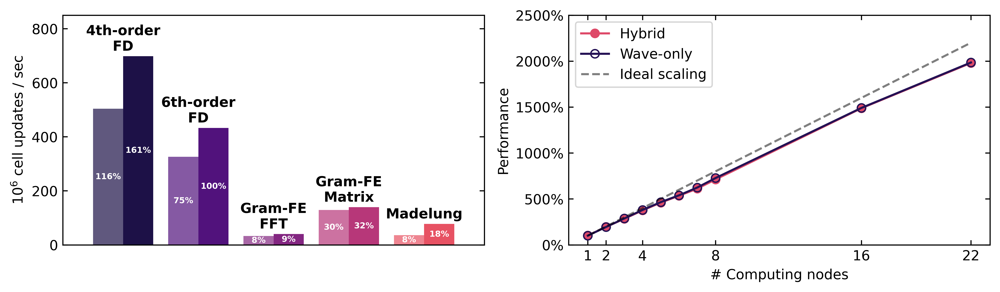

In [4]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the combined data from the CSV file
data_path = 'results/performance_test.csv' # Update this path
data = pd.read_csv(data_path)

set_cycle(9, 1)

# Define your folder to label mapping here
folder_to_label = {
    'gramfe_matmul_gpu': 'Gram-FE' + '\nMatrix - GPU',
    'gramfe_fft_gpu': 'Gram-FE' + '\nFFT - GPU',
    'fluid_gpu': 'Madelung - GPU',
    'fd2_gpu': '4th-order\nFD - GPU',
    'fd4_gpu': '6th-order\nFD - GPU',
    'gramfe_matmul_cpu': 'Gram-FE' + '\nMatrix - CPU',
    'gramfe_fft_cpu': 'Gram-FE' + '\nFFT - CPU',
    'fluid_cpu': 'Madelung - CPU',
    'fd2_cpu': '4th-order\nFD - CPU',
    'fd4_cpu': '6th-order\nFD - CPU',
}

# Map the folder names to labels
data['Label'] = data['FolderName'].map(folder_to_label)
# Calculate the average Perf_PerRank for each label
average_perf_per_label = data.groupby('Label', as_index=False)['Perf_Overall'].mean()

# Normalize to the performance of the 6th order FD and convert to percent
sixth_order_FD_avg_perf = average_perf_per_label.loc[3]["Perf_Overall"]
normalized_perf          = average_perf_per_label.copy()
#normalized_perf["Perf_Overall"] = (average_perf_per_label["Perf_Overall"] / fourth_order_FD_avg_perf) * 100


# Set the plot size
fig, (ax1, ax2) = plt.subplots(ncols = 2, figsize=(plot_width, plot_height_single), dpi=plot_dpi)  # High-resolution plot

# Get the default color cycle
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']


# Generate the bar plot manually to control colors
bars = []

for i, (label, perf) in enumerate(zip(normalized_perf['Label'], normalized_perf['Perf_Overall'])):
    if i%2 == 0:
        x_shift = -0.3
        alpha = 0.7
    else:
        x_shift = 0.3
        alpha = 1.0
    x = int(i/2) * 1.5
    perf /= 1e6
    bar = ax1.bar(x  + x_shift, height= perf, width=0.6, color=colors[int(i/2) % len(colors)], alpha=alpha)    # Add text above the bar
    bars.append(bar)
    if i%2 == 1:
        ax1.text(x=x, y=perf + 10, s=label.rstrip("- GPU"),
                ha='center', va='bottom', weight='bold')


# Add text inside the bar
for bar_container in bars:
    for bar in bar_container:
        height = bar.get_height()
        ax1.text(bar.get_x() + bar.get_width() / 2, height/2, f'{(height * 1e6 / sixth_order_FD_avg_perf) * 100:.0f}%',
                ha='center', va='center', color='white', weight='bold', fontsize=6)

ax1.set_xticks([])  # Hide x-ticks as before

# Configure primary y-axis
ax1.set_ylabel(r'$10^6$ cell updates / sec')
ax1.set_ylim(0, 850)
ax1.set_xlim(-1.2, 7.2)

ax1.tick_params(axis='x', which='both', direction='in', top=True)  # Enable top ticks
ax1.tick_params(axis='y', which='both', direction='in', right=True)  # Enable right ticks
#ax1.set_xticks(rotation=45)


# Load the combined data
data_path = 'results/scaling.csv'  # Update this path
data = pd.read_csv(data_path)

set_cycle(5, 2)
# Define your folder to label mapping here
folder_to_label = {
    'VortexPairLinear': 'Wave-only',
    'VortexPairLinear_Fluid': 'Hybrid',
    #'Fluid': 'Fluid',
    #'Wave': 'Wave'
    # Add your mappings
}

# Map the folder names to labels
data['Label'] = data['Scheme'].map(folder_to_label)

# Calculate the average Perf_Overall for each FolderAttribute and Rank
df = data.groupby(['Label', 'Rank'])['Perf_Overall'].mean().reset_index()

# Step 1: Find the Perf_Overall value for "Wave-only" at Rank 1
baseline_value = df[(df['Label'] == 'Wave-only') & (df['Rank'] == 1)]['Perf_Overall'].iloc[0]

# Step 2: Normalize all Perf_Overall values by this baseline
df['Normalized_Perf'] = df['Perf_Overall'] / baseline_value

# Step 3: Optionally, express as percentage
df['Normalized_Perf_Percent'] = df['Normalized_Perf'] * 100
print(df)

# Plot the average Perf_Overall for each FolderAttribute
for folder_attr, group_data in df.groupby('Label'):
    if folder_attr == "Wave-only":
        plt.plot(group_data['Rank'], group_data['Normalized_Perf_Percent'], c =plt.cm.magma(0.15), marker='o', fillstyle='none', linestyle='-', label=folder_attr)
    else:
        plt.plot(group_data['Rank'], group_data['Normalized_Perf_Percent'], c =plt.cm.magma(0.6), marker='o', linestyle='-', label=folder_attr)

x = np.arange(1, data['Rank'].max()+1)

ax2.plot(x, 100*x, label = "Ideal scaling", c="k", ls="--", alpha =0.5)
ax2.set_xlabel('# Computing nodes')
ax2.set_ylabel('Performance')
ax2.set_ylim(0, 2400)

# Set y-axis labels with '%' suffix
current_yticks = plt.gca().get_yticks()
ax2.set_yticks(current_yticks, [f'{y:.0f}%' for y in current_yticks])

ax2.legend()
ax2.set_xticks([1, 2, 4, 8, 16, 22])  # Assuming Rank is sequential and starts at 1
ax2.tick_params(axis='both', direction='in', top=True, right=True)

#plt.grid(True)

plt.savefig("plots/performance.pdf", bbox_inches='tight')
plt.show()


In [24]:
1979/2200

0.8995454545454545

# Interpolation

yt : [WARNING  ] 2024-06-30 20:36:23,304 Cannot determine code units ==> Use units_override to specify the units
yt : [WARNING  ] 2024-06-30 20:36:23,305 Assuming   length unit = 1.000000 cm
yt : [WARNING  ] 2024-06-30 20:36:23,306 Assuming     time unit = 1.000000 s
yt : [WARNING  ] 2024-06-30 20:36:23,307 Assuming     mass unit = 1.000000 g
yt : [WARNING  ] 2024-06-30 20:36:23,308 Assuming magnetic unit = 3.544908 gauss
yt : [INFO     ] 2024-06-30 20:36:23,352 Parameters: current_time              = 0.0
yt : [INFO     ] 2024-06-30 20:36:23,353 Parameters: domain_dimensions         = [64 64 16]
yt : [INFO     ] 2024-06-30 20:36:23,354 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2024-06-30 20:36:23,354 Parameters: domain_right_edge         = [1.   1.   0.25]
yt : [INFO     ] 2024-06-30 20:36:23,355 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2024-06-30 20:36:24,102 xlim = 0.000000 1.000000
yt : [INFO     ] 2024-06-30 20:36:24,102 ylim = 0.000000 1

(800, 800, 4)


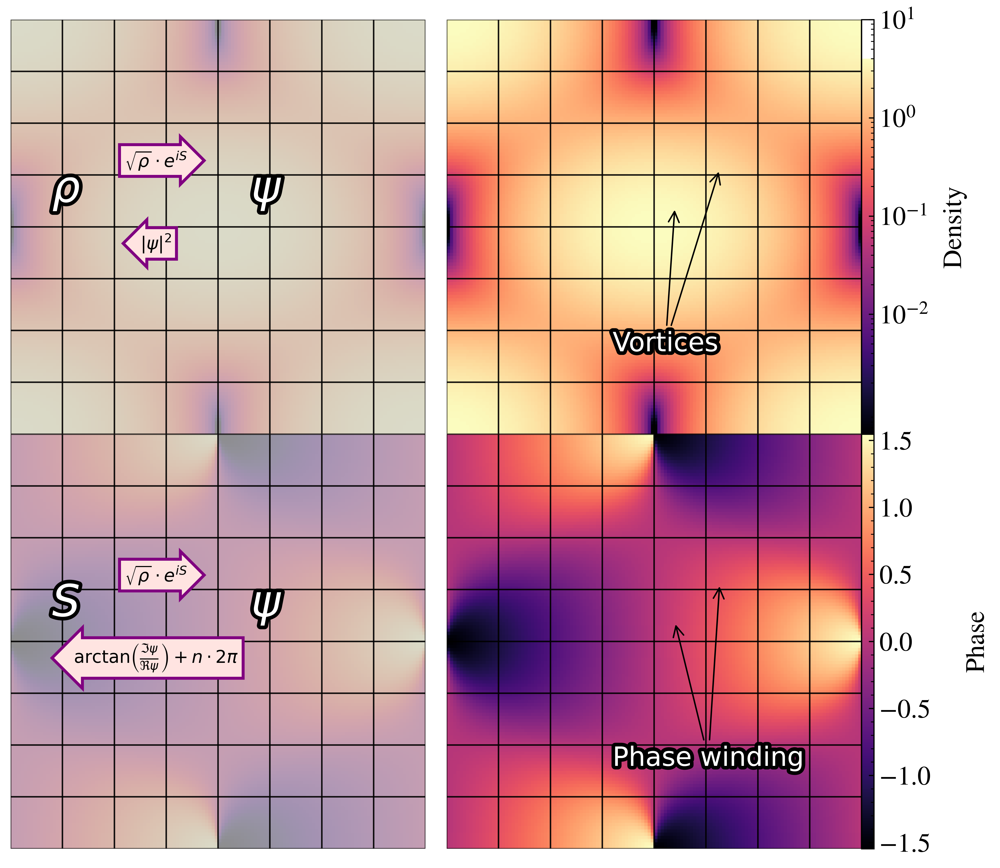

In [137]:
from __future__ import print_function, division, absolute_import

import argparse
import sys
import yt
import matplotlib
import matplotlib.pyplot as plt
import numpy as np

from mpl_toolkits.axes_grid1 import AxesGrid

import matplotlib.patheffects as PathEffects

colormap = 'magma'  # Define the colormap for the plots
# Create a series of datasets based on data files with indices in the specified range
dataset = yt.load("/home/xerox/Documents/Programming/hybrid-spectral-fdm/results/vortex_pair_linear_interpolation/{'OPT__FLU_INT_SCHEME': 8, 'OPT__INT_PHASE': 0, 'VorPairLin_kx': 1, 'OPT__REF_FLU_INT_SCHEME': 8}/Data_000000_hr")

current_axis = "z"

# Create a new figure for the current slice
fig = plt.figure(dpi=plot_dpi, figsize=(plot_width, plot_height_double))

# Create a grid of axes for multiple plots
grid = AxesGrid(
    fig,
    (0.075, 0.075, 0.85, 0.85),
    nrows_ncols=(2, 2),
    axes_pad=(0.2, 0.0),
    label_mode="L",
    share_all=True,
    cbar_location="right",
    cbar_mode="edge",
    direction="row",
    cbar_size="3%",
    cbar_pad="0%",
)


def reim2phase(field, data):
    return np.arctan2(data["gamer", "Imag"], data["gamer", "Real"])

yt.add_field(("gamer", "Phase"), function=reim2phase, sampling_type="local", units="")


# Define the fields to plot
fields_to_plot = [
    ("gas", "density"),
    ("gamer", "Phase"),
]

# Create a slice plot for the current dataset and field
slice_plot = yt.SlicePlot(dataset, current_axis, fields_to_plot)
slice_plot.set_log(("gamer", "Phase"), False)

slice_plot.annotate_grids(periodic=False)

for field in fields_to_plot:
    slice_plot.set_cmap(field, colormap)

# For each plotted field, associate it with the corresponding AxesGrid axes
for i, field in enumerate(fields_to_plot):
    plot = slice_plot.plots[field]
    plot.figure = fig
    plot.axes = grid[2 * i].axes
    plot.cax = grid.cbar_axes[i]

# Create a second slice plot for comparison
slice_plot_2 = yt.SlicePlot(dataset, current_axis, fields_to_plot)
slice_plot_2.set_log(("gamer", "Phase"), False)
slice_plot_2.annotate_grids(periodic=False)

for field in fields_to_plot:
    slice_plot_2.set_cmap(field, colormap)

# Associate the second slice plot with the AxesGrid axes
for i, field in enumerate(fields_to_plot):
    plot = slice_plot_2.plots[field]
    plot.figure = fig
    plot.axes = grid[2 * i + 1].axes

# Redraw the plot on the AxesGrid axes
slice_plot._setup_plots()
slice_plot_2._setup_plots()

# Assuming 'z' axis slices, the size of the plot, and other parameters
axis = 'z'
width = 1#dataset.domain_width.min().value  # Adjust based on your dataset

# Create Fixed Resolution Buffers (FRBs) for density and AMR level visualization
res = [800, 800]  # Adjust resolution based on your needs

# Extracting AMR level data
# Note: Modify this part according to how you can get AMR level data from your dataset
amr_data = slice_plot.data_source.to_frb(width, res, height=width)

# Visualizing AMR levels
# Assume `amr_data["index", "grid_level"]` provides the AMR level data, you may need to adjust this
amr_levels = amr_data["index", "grid_level"]
level_0_mask = amr_levels == 0
level_1_mask = amr_levels == 1

# Initialize an RGBA image with full transparency (alpha = 0)
amr_image_rgba = np.zeros((res[0], res[1], 4), dtype=np.float32)  # Last dimension for RGBA

# Set colors with alpha for AMR levels
# Here, 0.5 is used as an example alpha value for both levels, adjust according to your preferences
light_grey_rgba = [0.8, 0.8, 0.8, 0.9]  # Light grey with alpha for level 0
dark_grey_rgba  = [0.8, 0.8, 0.8, 0.7]  # Dark grey with alpha for level 1

# Apply colors with alpha based on AMR level masks
amr_image_rgba[level_0_mask, :] = light_grey_rgba
amr_image_rgba[np.logical_not(level_0_mask), :] = dark_grey_rgba

print(amr_image_rgba.shape)

# Plotting the RGBA image with alpha
# Using the same extent as before to align with other plots
grid[0].imshow(amr_image_rgba, origin='lower', extent=[-0.5, 0.5, -0.5, 0.5])
grid[2].imshow(amr_image_rgba, origin='lower', extent=[-0.5, 0.5, -0.5, 0.5])


#grid[0].set_ylabel("$y$")
#grid[2].set_ylabel("$y$")
#grid[2].set_xlabel("$x$")
#grid[3].set_xlabel("$x$")
grid[0].axis("off")
grid[1].axis("off")
grid[2].axis("off")
grid[3].axis("off")
grid.cbar_axes[0].get_yaxis().labelpad = 10
grid.cbar_axes[0].get_yaxis().set_ticks([1e-2, 1e-1, 1, 1e1])
grid.cbar_axes[0].set_ylabel(r"Density", rotation=90)
grid.cbar_axes[1].get_yaxis().labelpad = 24
grid.cbar_axes[1].set_ylabel(r"Phase", rotation=90)
# Get the DumpID from dataset parameters and save the plot
dump_id = dataset.parameters["DumpID"]
plt.savefig("plots/interpolation_error.pdf", bbox_inches='tight')

# Close the current figure to release resources
plt.show()
plt.close()


Plot saved as 'interpolation_error.pdf'


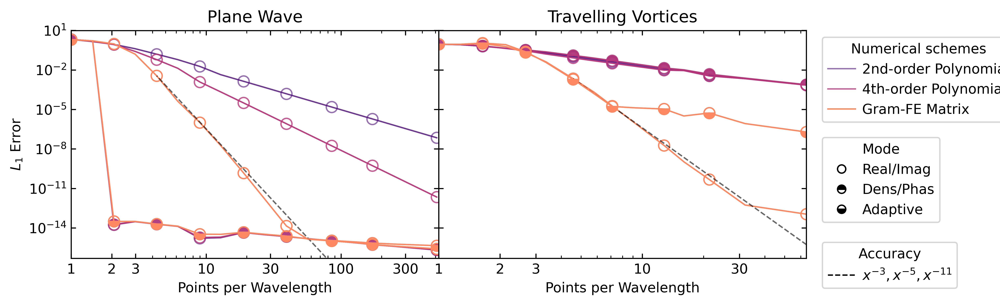

In [135]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import matplotlib.gridspec as gridspec


colors = set_cycle(5, 1)
fns = [
    'results/interpolation_plane_wave_old.csv',
    'results/interpolation_vortex_pair.csv',
]

# High-resolution plot setup
fig = plt.figure(figsize=(12, 3), dpi=600)

gs = gridspec.GridSpec(1, 3, width_ratios=[1, 1, 0.5], wspace=0.0)

# Assign axes for the plots
ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1])
legend_ax = fig.add_subplot(gs[2])

for i, fn in enumerate(fns):
    ax = [ax1, ax2][i]

    # Load the CSV file into a DataFrame
    df = pd.read_csv(fn)

    # Filter rows where OPT__FLU_INT_SCHEME equals OPT__REF_FLU_INT_SCHEME
    filtered_df = df[df['OPT__FLU_INT_SCHEME'] == df['OPT__REF_FLU_INT_SCHEME']]


    # Plot Mean_L1_Error as a function of PWave_NWavelength for different OPT__INT_PHASE options
    # Group by OPT__FLU_INT_SCHEME and OPT__INT_PHASE to plot each option as a separate line
    for (scheme, phase), group_data in filtered_df.groupby(['OPT__FLU_INT_SCHEME', 'OPT__INT_PHASE']):
        # Set line styles and labels based on phase
        marker    = 'o'# if phase == 0 else 'x'
        if phase == 0:
            fillstyle = 'none'

        elif scheme ==  8:
            fillstyle="bottom"
        else:
            fillstyle = "top"

        label_suffix = " - 1" if phase == 0 else " - 2"


        # Set labels based on scheme
        if scheme == 4:
            label = "2nd-order Polynomial"
            c     = colors[0]
            alpha = 0.6
            lw    = 1

            linestyle = '-'
        elif scheme == 6:
            label = "4th-order Polynomial"
            c     = colors[1]
            alpha = 0.8
            lw    = 1
            linestyle = '-'
        elif scheme == 8:
            label = "Gram-FE Matrix"
            c     = colors[2]
            alpha = 1.0
            lw    = 1
            linestyle = '-'

        #label += label_suffix

        if i == 0:
            x = 512 / group_data['PWave_NWavelength']
        elif i == 1:
            x = 64 / group_data["VorPairLin_kx"]

        y = group_data['Mean_L1_Error']

        ax.plot(x, y, c=c, alpha = alpha, lw = lw, label=label if phase == 0 else None, linestyle=linestyle, fillstyle=fillstyle, markersize=8)
        ax.plot(x, y, c=c, alpha = alpha, lw = lw, marker=marker, markevery=2, linestyle=linestyle, fillstyle=fillstyle, markersize=8)


        # Plotting reference lines based on label
        n_start = 15

        ls = ['3rd-order FD', '5th-order FD', 'Gram-FE Matrix']
        cs = [-3, -5, -11]
        if i == 0:
            ss = [12, 12, 12]
        elif i == 1:
            ss = [10, 10, 8]


        for i in range(len(ls)):
            c = cs[i]
            l = ls[i]
            s = ss[i]
            if label == l and phase == 0:
                y_ref = y.iloc[s] * (x.iloc[:s+1]/x.iloc[s])**c
                ax.plot(x.iloc[:s+1], y_ref, 'k--', alpha = 0.6, lw = 1.0)

    # Customize plot
    ax.set_xlabel('Points per Wavelength')
    ax.set_yscale("log")
    ax.set_xscale("log")
    ax.set_ylim([5e-17, 1e1])
    # Ticks on the inside and on all sides of the plot
    ax.tick_params(direction='in', which='both', top=True, right=True)
ax1.set_ylabel('$L_1$ Error')
ax2.set_yticklabels([])

# Define and place the legend
#accuracy_heading = [Line2D([0], [0], color='none', label='Accuracy')]
accuracy_handles = [Line2D([0], [0], color='k', ls="--", lw=0.5, label=r'$x^{-4}, x^{-6}, x^{-13}$')]
#legend_ax.legend(handles = scheme_handles + accuracy_heading + accuracy_handles, loc='upper left', title="Numerical schemes", handletextpad=0.5, handlelength=2, fancybox=True)

# Assume ax1 and ax2 are already set up as in previous examples
scheme_handles, scheme_labels = ax1.get_legend_handles_labels()

#for h in scheme_handles: h.set_marker("")

# First legend for "Numerical schemes"
legend1 = legend_ax.legend(scheme_handles, scheme_labels, loc='upper left', bbox_to_anchor=(0.05, 1), title="Numerical schemes", handletextpad=0.5, handlelength=2, fancybox=True)

# Create legend for line styles
line_style_handles = [
    Line2D([0], [0], color='black', ls='', marker = "o", lw=1.0, label='Real/Imag', fillstyle="none"),
    Line2D([0], [0], color='black', ls='', marker = "o", lw=1.0, label='Dens/Phas', fillstyle="top"),
    Line2D([0], [0], color='black', ls='', marker = "o", lw=1.0, label='Adaptive',  fillstyle="bottom"),
]
legend2 = legend_ax.legend(handles = line_style_handles, loc='upper left', bbox_to_anchor=(0.05, 0.56), title="Mode", handletextpad=0.5, handlelength=2, fancybox=True)


# Second legend for "Accuracy"
accuracy_handles = [Line2D([0], [0], color='k', ls="--", lw=1.0, label=r'$x^{-3}, x^{-5}, x^{-11}$')]
legend3 = legend_ax.legend(handles = accuracy_handles, loc='upper left', bbox_to_anchor=(0.05, 0.1), title="Accuracy", handletextpad=0.5, handlelength=2, fancybox=True)

legend_ax.add_artist(legend1)
legend_ax.add_artist(legend2)
# Disable axis of legend_ax
legend_ax.axis('off')
ax1.set_title("Plane Wave")
ax2.set_title("Travelling Vortices")

ax1.set_xlim([1, 530])
ax1.set_xticks([1, 2, 3, 10, 30, 100, 300], ['1', '2', '3', '10', '30', '100', '300'])

ax2.set_xlim([1, 64])
ax2.set_xticks([1, 2, 3, 10, 30], ['1', '2', '3', '10', '30'])
# Show or save the plot
#plt.tight_layout()
plt.savefig('plots/interpolation_error.pdf', bbox_inches='tight')  # Save the plot as a PNG file
# plt.show()  # Uncomment to display the plot instead

print("Plot saved as 'interpolation_error.pdf'")



In [50]:
a = set((64/np.logspace(0, 2, 25)).astype(int))
a

{0, 1, 2, 3, 4, 5, 6, 7, 9, 11, 13, 16, 20, 24, 29, 35, 43, 52, 64}

In [41]:
points_per_wave_length = np.logspace(0, 3, 20)
x = np.array(list(set((64/points_per_wave_length).astype(int))))
b = 64/x
c = 64/b
x, b, c

/tmp/ipykernel_6237/1959018646.py:3: RuntimeWarning: divide by zero encountered in divide
  b = 64/x


(array([64,  1,  2,  3,  0,  5,  7, 10, 44, 14, 21, 30]),
 array([ 1.        , 64.        , 32.        , 21.33333333,         inf,
        12.8       ,  9.14285714,  6.4       ,  1.45454545,  4.57142857,
         3.04761905,  2.13333333]),
 array([64.,  1.,  2.,  3.,  0.,  5.,  7., 10., 44., 14., 21., 30.]))

In [37]:
#y = 64 * (2*np.pi/k)
k = (64 /np.logspace(0, 2, 20)).astype(int)
set(k)

{0, 1, 2, 3, 4, 5, 7, 9, 11, 14, 19, 24, 30, 39, 50, 64}

In [195]:
128 / np.array([1, 2, 3, 4, 6, 9, 13, 19, 27, 40, 57, 83, 119, 172, 247, 355, 512]) / (2*np.pi)

array([20.37183272, 10.18591636,  6.79061091,  5.09295818,  3.39530545,
        2.26353697,  1.56706406,  1.07220172,  0.75451232,  0.50929582,
        0.35740057,  0.24544377,  0.17119187,  0.11844089,  0.08247706,
        0.05738544,  0.03978874])

In [201]:
 a / 64 * 2*np.pi

array([50.26548246, 25.13274123, 16.75516082, 12.56637061,  8.37758041,
        5.58505361,  3.86657557,  2.64555171,  1.86168454,  1.25663706,
        0.88185057,  0.60560822,  0.42239901,  0.29224118,  0.20350398,
        0.14159291,  0.09817477])

In [204]:
512/1/(2*np.pi)

81.48733086305042

# Power spectrum

In [85]:
print("#Dump ID\tDump Time")
for i, a in enumerate(scale_factors):
    print(i, "\t", f"{a:2.16f}")
print("***************END LINE***************")

#Dump ID	Dump Time
0 	 0.0099009900990099
1 	 0.0100000000000000
2 	 0.0109890109890110
3 	 0.0123456790123457
4 	 0.0140845070422535
5 	 0.0156250000000000
6 	 0.0196078431372549
7 	 0.0243902439024390
8 	 0.0312500000000000
9 	 0.0476190476190476
10 	 0.0625000000000000
11 	 0.0666666666666667
12 	 0.0714285714285714
13 	 0.0769230769230769
14 	 0.0833333333333333
15 	 0.0909090909090909
16 	 0.1000000000000000
17 	 0.1111111111111111
18 	 0.1250000000000000
***************END LINE***************


In [27]:
1/2.0694662e-01 - 1, 1/1.6592690e-01 - 1

(3.8321639657608326, 5.026750334032638)

         Method Resolution  N_value
38816  spectral      n_512      512
38817  spectral      n_512      512
38818  spectral      n_512      512
38819  spectral      n_512      512
38820  spectral      n_512      512
fluid 64
fluid 128
fluid 256
fluid 512
nbody 128
nbody 256
nbody 512
spectral 512
spectral 1024
spectral 2048
fluid 64
fluid 128
fluid 256
fluid 512
nbody 128
nbody 256
nbody 512
spectral 512
spectral 1024
spectral 2048
fluid 64
fluid 128
fluid 256
fluid 512
nbody 128
nbody 256
nbody 512
spectral 512
spectral 1024
spectral 2048
fluid 64
fluid 128
fluid 256
fluid 512
nbody 128
nbody 256
nbody 512
spectral 512
spectral 1024
spectral 2048


/tmp/ipykernel_15486/131906738.py:237: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


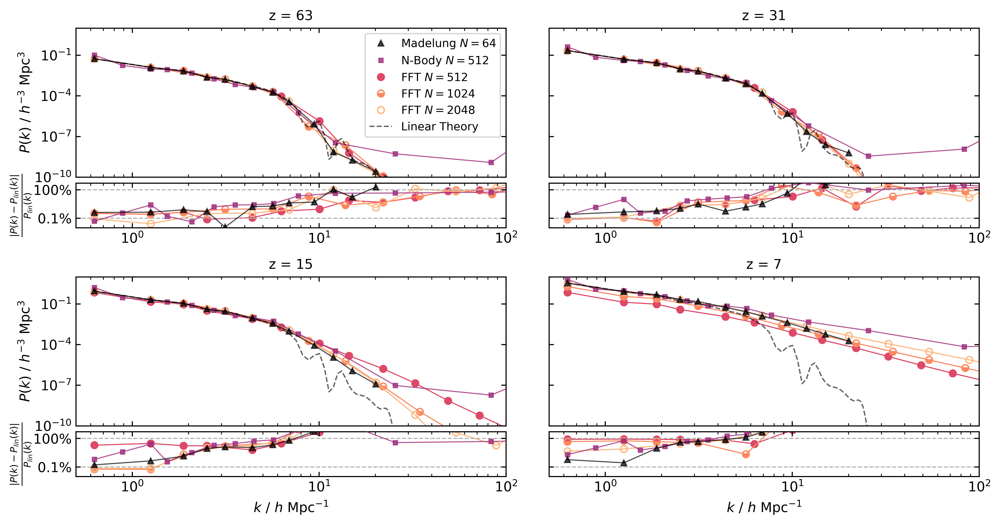

In [16]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy

redshifts     = np.array([100, 99, 90, 80, 70, 63, 50, 40, 31, 20, 15, 14, 13, 12, 11, 10, 9, 8, 7])
redshifts     = np.sort(redshifts)[::-1]
scale_factors = 1/(redshifts+1)

# Read the DataFrame from disk

input_file = "results/fdm_spectra.csv"
fdm_df = pd.read_csv(input_file)
input_file = "results/cdm_spectra.csv"
cdm_df = pd.read_csv(input_file)
combined_df = pd.concat([fdm_df, cdm_df], ignore_index=True)

# Define your custom order for the 'Method' column assuming correct mapping to your methods
method_order = ['fluid', 'nbody', 'spectral']  # Adjust the actual method names
combined_df['Method'] = pd.Categorical(combined_df['Method'], categories=method_order, ordered=True)

# Assuming 'Resolution' contains the 'N' value like 'n_64', 'n_128', etc.
# Sorting by 'Method' first and then by the numeric part of the 'Resolution'
combined_df['N_value'] = combined_df['Resolution'].apply(lambda x: int(x.split('_')[1]))
combined_df = combined_df.sort_values(by=['Method', 'N_value'])

# Check the top entries of the DataFrame to ensure they are sorted correctly
print(combined_df[combined_df['Method'] == 'spectral'][['Method', 'Resolution', 'N_value']].head())



# Print or inspect the sorted DataFrame to ensure correctness
#print(combined_df[['Method', 'Resolution', 'N_value']])

# Set the color cycle to 'magma'
num_colors = 12
colors = plt.cm.magma([0, 0.45, 0.6, 0.75, 0.85])
plt.rcParams['axes.prop_cycle'] = plt.cycler(color=colors)

# Find the unique Spec IDs in the DataFrame
spec_ids = combined_df['Spec ID'].unique()

# Filter out the reference spectrum (Spec ID 0)
a_ref  = scale_factors[0]

# Set up figure with custom layout
fig = plt.figure(figsize=(12, 6), dpi=600)

# Create a GridSpec with 8 rows (for 4 pairs of k-P and error plots) and 2 columns
gs = gridspec.GridSpec(5, 2, height_ratios=[2, 0.6, 0.5, 2, 0.6], hspace=0.0, wspace=0.1)

legend_added = False

# Define marker and marker size mappings for different methods
marker_dict = {
    'nbody': 's',  # Example method names
    'gramfe': 's',
    'finite_difference': '^',
    'fluid': '^',
    'spectral': 's',
}
size_dict = {
    'nbody': 3,
    'gramfe': 5,
    'finite_difference': 5,
    'fluid': 4,
    'spectral': 5,
}

lw_dict = {
    'nbody': 0.8,
    'gramfe': 0.8,
    'finite_difference': 0.8,
    'fluid': 0.8,
    'spectral': 0.8,
}
alpha_dict = {
    'fluid': 0.7,
    'nbody': 0.8,
    'gramfe': 0.8,
    'finite_difference': 0.8,
    'spectral': 1.0,
}
method_name_dict = {
    'finite_difference': 'Finite Difference',
    'fluid': 'Madelung',
    'gramfe': 'Gram-Fourier extension',
    'nbody': 'N-Body',
    'spectral': 'FFT',
}
zorder_dict = {
    'finite_difference': 'Finite Difference',
    'fluid': 10,
    'gramfe': 'Gram-Fourier extension',
    'nbody': 5,
    'spectral': 0,
}



# Function to format resolution label
def format_resolution_label(resolution):
    # Extracts number from resolution string (e.g., 'n_128') and formats it
    number = resolution
    return f"$N = {number}$"


for i, spec_id in enumerate([5, 8, 10, 18]):
    a = scale_factors[spec_id]
    row = int(i / 2)
    col = (i % 2 != 0)
    ax1 = fig.add_subplot(gs[row + 2 * row, col])  # k-P plot for this pair
    ax2 = fig.add_subplot(gs[row + 2 * row + 1, col], sharex=ax1)  # Error plot directly below ax1

    # Remove x-tick labels for ax1, since ax2 will share the x-axis
    plt.setp(ax1.get_xticklabels(), visible=False)


    for (method, resolution), group_df in combined_df.groupby(['Method', 'N_value']):
        print(method, resolution)  # Check order of appearance

        df = group_df[group_df['Spec ID'] == spec_id]
        df_ref = group_df[group_df['Spec ID'] == 0]

        if df.empty or df_ref.empty:
            continue

        if method == "finite_difference":
            continue
        if method == "gramfe":# and not resolution == "n_2048":
            continue
        if method == "fluid" and not resolution == 64:
            continue
        if method == "spectral" and not (resolution == 512 or resolution == 2048 or resolution ==1024):
            continue
        if method == "nbody" and not resolution == 512:
            continue

        k = df["k"].values
        P = df["Power"].values
        P_ref = (a / a_ref) ** 2 * df_ref['Power'].values

        # Apply method name mapping
        method_label = method_name_dict.get(method, method)  # Default to raw method name if not found
        # Format resolution label
        resolution_label = format_resolution_label(resolution)

        label = f"{method_label} {resolution_label}"
        fillstyle="full"
        # Select marker and size based on the method
        marker = marker_dict.get(method, 'o')  # Default to 'o' if method not in dict
        if method == "spectral":
            marker_d2 = {
                512: "o",
                1024: "o",
                2048: "o"
            }
            fillstyle_d2 = {
                512: "full",
                1024: "bottom",
                2048: "none"
            }
            marker = marker_d2[resolution]
            fillstyle = fillstyle_d2[resolution]
        size = size_dict.get(method, 4)  # Default to 4 if method not in dict
        lw = lw_dict.get(method, 4)  # Default to 4 if method not in dict
        alpha = alpha_dict.get(method, 4)  # Default to 4 if method not in dict
        zorder = zorder_dict.get(method, 4)  # Default to 4 if method not in dict


        # Calculate logarithmically spaced indices based on the length of k, avoiding log10(0)
        indices = np.geomspace(1, len(k), num=15, dtype=int) - 1  # Subtract 1 to adjust for index starting at 0

        # Ensure unique indices if overlapping occurs due to rounding
        unique_log_indices = np.unique(indices)

        # Plot the entire dataset with lines
        line, = ax1.plot(k[unique_log_indices], P[unique_log_indices], linestyle='-', lw = lw, alpha=alpha, zorder=zorder)
        # Overlay markers only on the subset of points
        ax1.plot(k[unique_log_indices], P[unique_log_indices], label=label, linestyle='', marker=marker, fillstyle=fillstyle, markersize=size, alpha=alpha, c=line.get_color(), zorder=zorder)

        #ax1.plot(k, P, label=label, linestyle='--', marker='o', markersize=4, alpha=0.7) #linestyle='--', marker=marker, markersize=size, )
        if method == "spectral" and resolution == 2048:
            line = ax1.plot(k, P_ref, c="k", lw=1.0, alpha=0.6, ls="--", zorder=10, label="Linear Theory")[0]

            # Add a white border to the line using patheffects
            line.set_path_effects([PathEffects.Stroke(linewidth=2.0, foreground='white'), PathEffects.Normal()])


        error = np.abs(P - P_ref) / P_ref
        # Plot the entire dataset with lines
        ax2.plot(k[unique_log_indices], error[unique_log_indices], linestyle='-', marker=marker, fillstyle=fillstyle, markersize=size, alpha=alpha, lw = lw, c=line.get_color(), zorder=zorder)

    if not legend_added:
        ax1.legend(loc='upper right', fontsize='small', ncol=1)
        legend_added = True

    ax1.set_title(f'z = {redshifts[spec_id]}', fontsize=10)
    ax1.set_yscale('log')
    ax1.set_xscale('log')
    ax1.set_ylim(1e-10, 1e1)  # Adjust as needed
    ax1.set_xlim(0.5, 100)  # Adjust as needed
    #ax1.grid(True, which="both", ls="--")
    ax2.set_xscale('log')
    ax2.set_yscale('log')
    ax2.set_ylim(1e-4, 5)  # Adjust as needed
    ax2.grid(True, which="both", axis="y", ls="--")

    # Enable ticks on the top and right axes
    ax1.tick_params(axis='x', which='both', direction='in', top=True)  # Enable top ticks
    ax1.tick_params(axis='y', which='both', direction='in', right=True)  # Enable right ticks
    ax2.tick_params(axis='x', which='both', direction='in', top=True)  # Enable top ticks
    ax2.tick_params(axis='y', which='both', direction='in', right=True)  # Enable right ticks


    if row == 1:  # Only set xlabel for the last row of error plots
        ax2.set_xlabel(r'$k$ / $h$ Mpc$^{-1}$')

    if col == 0:
        ax1.set_ylabel(r'$P(k)$ / $h^{-3}$ Mpc$^3$',labelpad=20)
        ax2.set_ylabel(r'$\frac{|P(k) - P_{lin}(k)|}{P_{lin}(k)}$', labelpad=20)
        # Adjust y-axis label position
        ax1.yaxis.set_label_coords(-0.1, 0.5)
        ax2.yaxis.set_label_coords(-0.1, 0.5)

        # Set the locations for the y-ticks
        ax2.set_yticks([1e-3, 1])

        # Set the labels for the y-ticks
        ax2.set_yticklabels([r"$0.1\%$", r"$100\%$"])
    if col == 1:  # Remove y-ticks and labels for the second column
        ax1.set_yticklabels([])
        ax2.set_yticklabels([])
        ax2.set_yticks([1e-3, 1])
        ax2.grid(True, which='both', axis="y", linestyle='--')


# Remove padding between k-P and error plots while keeping padding between sets
gs.update(hspace=0.07)  # Adjust space between the k-P/error plot groups

plt.tight_layout()

plt.savefig('plots/power_spectrum.pdf', bbox_inches='tight')  # Save the plot as a PNG file
plt.show()


## Compute softening length

In [22]:
# Calculation in Python
box_size_mpc = 2.8  # Size of the comoving box in Mpc/h
n_particles = 512**3  # Number of particles

# Mean inter-particle separation
l = (box_size_mpc ** 3 / n_particles) ** (1/3)

# Typical gravitational softening length range (1/20 to 1/40 of l)
epsilon_min = l / 40
epsilon_max = l / 20

l, epsilon_min, epsilon_max

(0.005468750000000001, 0.00013671875000000004, 0.0002734375000000001)

In [264]:
pip install yt

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


# PatchCount plot


In [3]:
import matplotlib.pyplot as plt
import numpy as np
import re


def parse_patch_file(filename):
    data = {}
    regex_pattern = re.compile(r'\d+\(')  # Matches numbers followed by a '('
    with open(filename, 'r') as file:
        current_time = None
        level_aggregate = None

        for line in file:
            line = line.strip()
            if line.startswith('Time'):
                # Save the aggregated data from the previous timestamp
                if current_time is not None:
                    data[current_time] = level_aggregate

                # Prepare for a new time block
                current_time = float(line.split('=')[1].split(',')[0].strip())
                level_aggregate = {f'Level {i}': 0 for i in range(10)}  # Adjust for 10 levels
            elif line.startswith('Rank'):
                continue  # Skip the header line
            elif 'Sum:' in line or 'Ave:' in line or 'Imb:' in line or 'Weighted' in line:
                continue  # Skip summary lines
            elif line and (line[0].isdigit() or ' ' in line):
                # Extract only the patch counts before the parenthesis using regex
                matches = regex_pattern.findall(line)
                patch_counts = [int(match[:-1]) for match in matches]  # Strip the trailing '(' and convert to int
                for i, count in enumerate(patch_counts):
                    level_aggregate[f'Level {i}'] += count

        # Don't forget to save the last set of data
        if current_time is not None:
            data[current_time] = level_aggregate

    return sorted(data.items())


def parse_timing_file(filename):
    data = []
    with open(filename, 'r') as file:
        current_time = None
        categories = None
        reading_levels = False
        level_data = {}

        for line in file:
            if 'Time :' in line:
                # Extract time from the line
                time_match = re.search(r"(\d+\.\d+e[+-]?\d+)", line)
                if time_match:
                    current_time = float(time_match.group(1))

            elif 'Integration Loop' in line:
                # Start reading the levels after the next line of dashes
                _ = next(file)  # This skips the line of dashes immediately after 'Integration Loop'
                categories = next(file).strip().split()[2:]  # Read the categories from the following line
                reading_levels = True

            elif reading_levels:
                if '------' in line:
                    # This line of dashes signifies the end of the section
                    if level_data:
                        data.append((current_time, level_data))
                        level_data = {}
                    reading_levels = False
                    categories = None
                else:
                    parts = re.split(r'\s+', line.strip())
                    if parts[0].isdigit():  # This is a level data line
                        level = int(parts[0])
                        #print(parts)
                        values = list(map(float, parts[2:2+len(categories)]))  # Get values matching to the categories
                        #print(values)
                        level_data[level] = dict(zip(categories, values))

        # Check to append the last captured data if the file ends without another set of dashes
        if level_data:
            data.append((current_time, level_data))

    return sorted(data, key=lambda x: x[0])



# Example file path
file_path = 'results/large_box/Record__PatchCount'
data1 = parse_patch_file(file_path)


# Assuming the file is named 'Record__Timing'
file_path = 'results/large_box/Record__Timing'
data2 = parse_timing_file(file_path)


In [4]:

times2, category_dicts = zip(*data2)

In [5]:
category_dicts[0].keys()

dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

TypeError: float() argument must be a string or a real number, not 'dict'

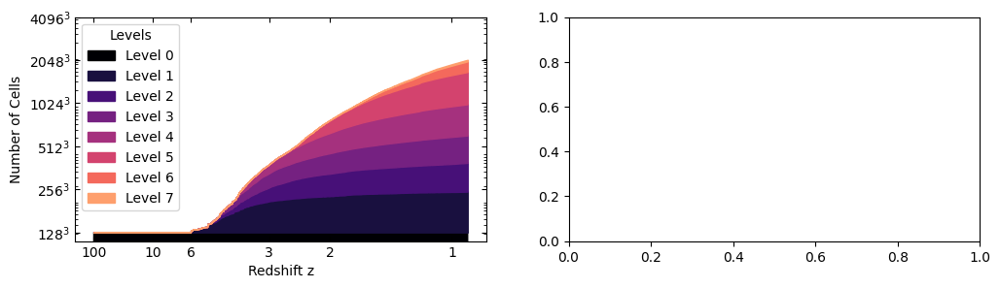

In [12]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.gridspec as gridspec

def plot_data(data1, data2):
    # Set up the figure and gridspec
    fig = plt.figure(figsize=(12, 3))
    gs = gridspec.GridSpec(1, 2, width_ratios=[1, 1])

    # Extract times and level data for the first plot
    times1, level_data = zip(*data1)
    cells_per_patch = 8**3
    ax1 = plt.subplot(gs[0])
    colors1 = plt.get_cmap('magma')(np.linspace(0, 1 - 0.2, 8))  # Only 8 colors for levels 0 to 7

    # Aggregate cells data for stacking
    cell_counts = {level: [round((info[level] * cells_per_patch)) for info in level_data] for level in level_data[0] if int(level.split()[1]) <= 7}
    previous_values = np.zeros(len(times1))

    # Stack area for each level, but only up to level 7
    for level in sorted(cell_counts, key=lambda x: int(x.split()[1])):  # Ensure correct level order
        current_values = np.array(cell_counts[level])
        ax1.fill_between(times1, previous_values + current_values, previous_values, color=colors1[int(level.split()[1])], label=level)
        previous_values += current_values

    ax1.set_xlabel('Redshift z')
    ax1.set_ylabel('Number of Cells')
    #ax1.set_xscale("log")
    ax1.set_yscale("log")
    ax1.set_yticks([128**3, 256**3, 512**3, 1024**3, 2048**3, 4096**3], [r"$128^3$", r"$256^3$", r"$512^3$", r"$1024^3$", r"$2048^3$", r"$4096^3$"])
    redshifts = np.array([100, 10, 6, 3, 2, 1])
    ax1.set_xticks(1/(redshifts+1), ["100", "10", "6", "3", "2", "1"])
    ax1.tick_params(direction='in', which='both', top=True, right=True)
    ax1.legend(title='Levels', loc='upper left')


    # Extract times and category data for the second plot
    times2, category_dicts = zip(*data2)
    categories = sorted({cat for d in category_dicts for cat in d.keys()})
    print(categories)
    ax2 = plt.subplot(gs[1])
    color_map = plt.get_cmap('magma')
    base_colors = color_map(np.linspace(0, 1-0.2, len(categories)))

    # Prepare plot data for the second plot
    values_stack = np.zeros((len(times2), len(categories)))
    for i, cat in enumerate(categories):
        values_stack[:, i] = np.array([d.get(cat, 0) for d in category_dicts])

    prev_values = np.zeros(len(times2))
    for idx, category in enumerate(categories):
        ax2.fill_between(times2, prev_values + values_stack[:, idx], prev_values, color=base_colors[idx], label=category)
        prev_values += values_stack[:, idx]

    ax2.set_xlabel('Redshift z')
    ax2.set_ylabel('Runtime per timestep on level 0 (s)')
    redshifts = np.array([100, 10, 6, 3, 2, 1])
    ax2.set_xticks(1/(redshifts+1), ["100", "10", "6", "3", "2", "1"])
    ax2.tick_params(direction='in', which='both', top=True, right=True)
    ax2.legend(title='Categories', loc='upper left')

    plt.tight_layout()
    plt.savefig("plots/runtime.pdf", bbox_inches='tight')
    plt.show()


# Assuming data1 and data2 are predefined somewhere in your code
plot_data(data1, data2)


# 2D Power Spectra

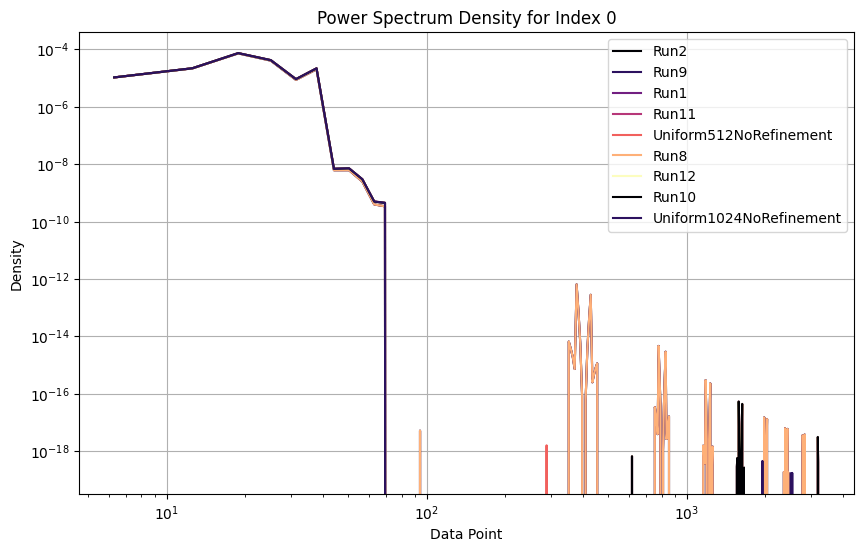

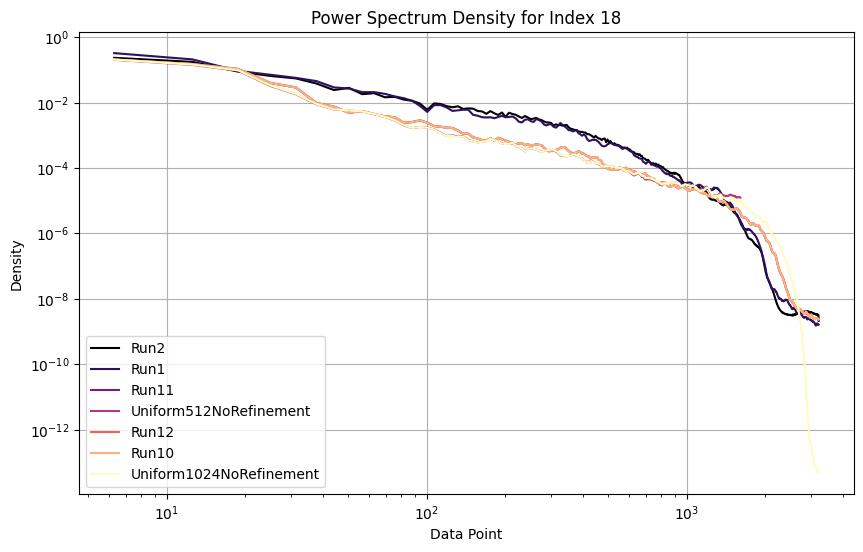

In [159]:
import os
import matplotlib.pyplot as plt

set_cycle(7)
def read_and_plot_data(base_folder, indices):
    # List all subfolders in the base folder
    subfolders = [os.path.join(base_folder, f) for f in os.listdir(base_folder) if os.path.isdir(os.path.join(base_folder, f))]

    # Loop through each index you are interested in
    for index in indices:
        plt.figure(figsize=(10, 6))  # Create a new figure for each index

        # Loop through each subfolder
        for subfolder in subfolders:
            # Construct the filename pattern to search for
            exclude = ["Run1", "Run2", "Run3","Run4"]
            if "Run5" in subfolder or "Run3" in subfolder or "Run4" in subfolder:
                continue
            if "Run6" in subfolder or "Run7" in subfolder or "Run3" in subfolder or "Run4" in subfolder:
                continue


            file_patterns = [
                f"power_spectrum_Density_{index:06d}_lv_04_1024_ndim_2.txt",
                f"power_spectrum_Density_{index:06d}_lv_00_512_ndim_2.txt",
                f"power_spectrum_Density_{index:06d}_lv_00_1024_ndim_2.txt",
                f"power_spectrum_Density_{index:06d}_lv_02_1024_ndim_2.txt"
            ]

            for file_pattern in file_patterns:
                file_path = os.path.join(subfolder, file_pattern)

                # Check if file exists and read data
                if os.path.exists(file_path):
                    with open(file_path, 'r') as file:
                        data = [float(line.strip()) for line in file if line.strip()]

                    N = int(len(data)/2)


                    # Plot the data
                    plt.loglog(data[:N], data[N:], label=f'{os.path.basename(subfolder)}')

        # Configure plot settings
        plt.title(f'Power Spectrum Density for Index {index}')
        plt.xlabel('Data Point')
        plt.ylabel('Density')
        plt.legend()
        plt.grid(True)

        # Show the plot
        plt.show()

# Usage example:
base_folder = '/home/xerox/Documents/Paper/A hybrid scheme combining fluid and wave solvers/hybrid_scheme_paper/hybrid_scheme_paper/2d_power'
indices = [0, 18]  # Add the indices you want to plot data for
read_and_plot_data(base_folder, indices)


## Mass conservation

In [4]:
(1 - 1.7561600e+02/1.7551573e+02)*100

-0.05712878270227595